**last update: 08/23/2024**  

This notebook is for Bayesian Gaussian process regression test.

Dataset: 2*2 spatial average in latitude (4,6) longitude (36,38). CMIP6 annually, 1850 -2100. 13 models. Short-term oscillations(<10years) & mid-term oscillations(~30years). Consider long-term trend with KGCM.

Goal: Build a proper GPR model for virtual observations by sklearn package.

Design: For some kernels, fine tune the hyperparameters and consider the evolving uncertainty with more observation years.

Note: In this notebook, there is cross validation(leave-one-out) for 2 rounds(one for kernel structure's selection, one for hyperparameter tuning). Use the rolling mean value of other models as prior, one model as the virtual observation and plot. Each model will be taken as the virtual observation once(1 round), and the total lml for all the models(all rounds) is used as the evaluation.

Fine tuning: Use another 5 models from CMIP6(not included in training models) as virtual observations(as test). Use training as piror, fit the GPR to virtual observations and then calculate lml as evaluation.

# Package

In [22]:
import numpy as np
from sklearn.model_selection import GridSearchCV
from tqdm import tqdm
from sklearn.gaussian_process import GaussianProcessRegressor
from sklearn.gaussian_process.kernels import RBF, WhiteKernel, ExpSineSquared, ConstantKernel as C
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.model_selection import RandomizedSearchCV, ParameterGrid
from scipy.optimize import minimize
from pyswarm import pso
from bayes_opt import BayesianOptimization
from scipy.linalg import cholesky, cho_solve,cho_factor,solve_triangular
from scipy.signal import periodogram, welch
from scipy.fft import fft
from statsmodels.tsa.stattools import acf
from sklearn.gaussian_process.kernels import Kernel, WhiteKernel, Matern, RationalQuadratic as RQ, ConstantKernel as C
from sklearn.preprocessing import PolynomialFeatures
from sklearn.gaussian_process import GaussianProcessRegressor
import pywt
from sklearn.gaussian_process.kernels import RBF, ConstantKernel as C, Matern, RationalQuadratic, DotProduct
from sklearn.preprocessing import PolynomialFeatures
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
from statsmodels.graphics.tsaplots import plot_acf
from bayes_opt import BayesianOptimization, UtilityFunction
from properscoring import crps_gaussian
from sklearn.preprocessing import StandardScaler
from sklearn.gaussian_process.kernels import RBF, WhiteKernel

# Data

In [23]:
rainfall = pd.read_csv('../data/CMIP5_sl/sl_annual_pr_1850-2099.csv')
rainfall = rainfall.set_index('years',drop=True)
rainfall.columns = [i+1 for i in range(rainfall.shape[1])]
rainfall_test = pd.read_csv('../data/CMIP5_sl/test_sl_annual_pr_1850-2099.csv')
rainfall_test = rainfall_test.set_index('years',drop=True)
rainfall_test.columns = [i+1 for i in range(rainfall_test.shape[1])]

In [24]:
window_size = 50
detrended_rainfall = rainfall.copy()

for col in rainfall.columns[1:]: 
    rolling_mean = rainfall[col].rolling(window=window_size, min_periods=1).mean()
    detrended_rainfall[col] = rainfall[col] - rolling_mean

detrended_rainfall_yearly = detrended_rainfall.copy()

for column in detrended_rainfall.columns:
    # Filter data before 1950
    historical_data = detrended_rainfall.loc[detrended_rainfall.index < 1950, column]
    
    # Calculate mean and std
    mean_value = historical_data.mean()
    std_value = historical_data.std()
    
    # Standardize the column using mean and std
    detrended_rainfall_yearly[column] = (detrended_rainfall[column] - mean_value) / std_value
    
detrended_rainfall_yearly = detrended_rainfall_yearly.drop(columns=[5, 11, 16])
detrended_rainfall_yearly.columns = range(1, 14)

In [25]:
detrended_rainfall_yearly

,1,2,3,4,5,6,7,8,9,10,11,12,13
years,,,,,,,,,,,,,
1850,0.086345,-0.104944,-0.104514,0.167215,0.016003,0.133972,0.050004,0.059518,-0.030721,0.027897,-0.114689,0.007817,0.186600
1851,1.985922,-0.515058,0.201100,0.010804,-0.100498,1.446258,0.143044,1.019042,-0.381946,0.881748,0.254067,-1.132733,1.415491
1852,2.602910,0.606947,-0.620520,-0.465935,0.196431,0.701439,0.854296,0.568101,-0.033655,0.859114,-0.077032,0.811026,0.188143
1853,1.985626,-1.452046,-0.299911,1.731584,0.063831,1.624375,-1.652074,-0.388539,1.509070,1.160791,-1.032856,-0.795364,0.484758
1854,-1.965990,-1.232826,-0.709740,-0.129838,-0.342703,0.478823,0.013900,-0.444610,-0.113076,-1.583100,-0.549470,1.116443,1.077985
...,...,...,...,...,...,...,...,...,...,...,...,...,...
2095,1.379288,-0.954476,1.091252,0.059335,2.827316,1.155234,0.490075,-0.395227,1.107977,-1.135506,-1.660443,-2.012389,0.332104
2096,2.033525,-0.200653,-0.545206,1.464092,1.229887,-1.023826,-2.228005,1.130732,-0.112630,0.846322,-0.747256,-1.035061,-0.120996
2097,2.782337,-1.349091,0.536330,2.249761,-0.476658,0.641825,2.098642,3.012515,-1.362178,0.872298,0.705167,0.958057,-0.530598


In [26]:
rainfall_test

,1,2,3,4,5
years,,,,,
1850,370.093707,799.051011,845.882912,805.420122,308.689653
1851,470.173302,1180.320124,750.065067,1026.501760,120.971332
1852,431.992894,993.640702,433.894353,764.727677,305.525644
1853,462.609683,838.858434,643.227750,742.516874,383.780851
1854,228.148613,1763.167428,604.948462,1102.213979,417.198475
...,...,...,...,...,...
2095,592.164403,1358.894037,494.584827,1702.952990,422.773697
2096,653.838106,1153.307698,961.888290,1228.346561,203.833493
2097,465.003871,1314.801648,963.435967,1721.906534,471.546750


In [27]:
rainfall_yearly = rainfall.copy()

for column in rainfall.columns:
    # Filter data before 1950
    historical_data = rainfall.loc[rainfall.index < 1950, column]
    
    # Calculate mean and std
    mean_value = historical_data.mean()
    std_value = historical_data.std()
    
    # Standardize the column using mean and std
    rainfall_yearly[column] = (rainfall[column] - mean_value) / std_value
    
rainfall_yearly = rainfall_yearly.drop(columns=[5, 11, 16])
rainfall_yearly.columns = range(1, 14)
# Save the standardized data to a new CSV file
# export_path = "../data/CMIP5_s/scaled_s_annual_pr_1850-2100.csv"
# rainfall_yearly.to_csv(export_path)

In [28]:
rainfall_yearly_test = rainfall_test.copy()

for column in rainfall_test.columns:
    # Filter data before 1950
    historical_data = rainfall_test.loc[rainfall_test.index < 1950, column]
    
    # Calculate mean and std
    mean_value = historical_data.mean()
    std_value = historical_data.std()
    
    # Standardize the column using mean and std
    rainfall_yearly_test[column] = (rainfall_test[column] - mean_value) / std_value


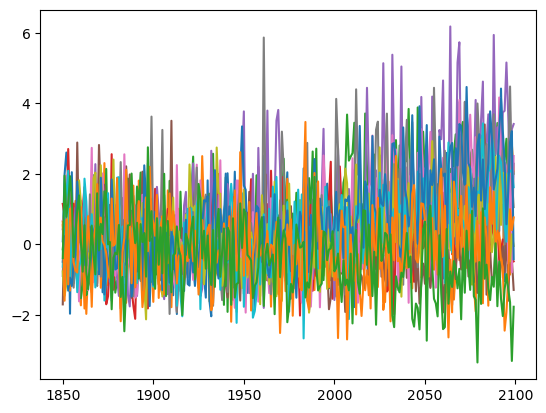

In [31]:
plt.plot(rainfall_yearly)

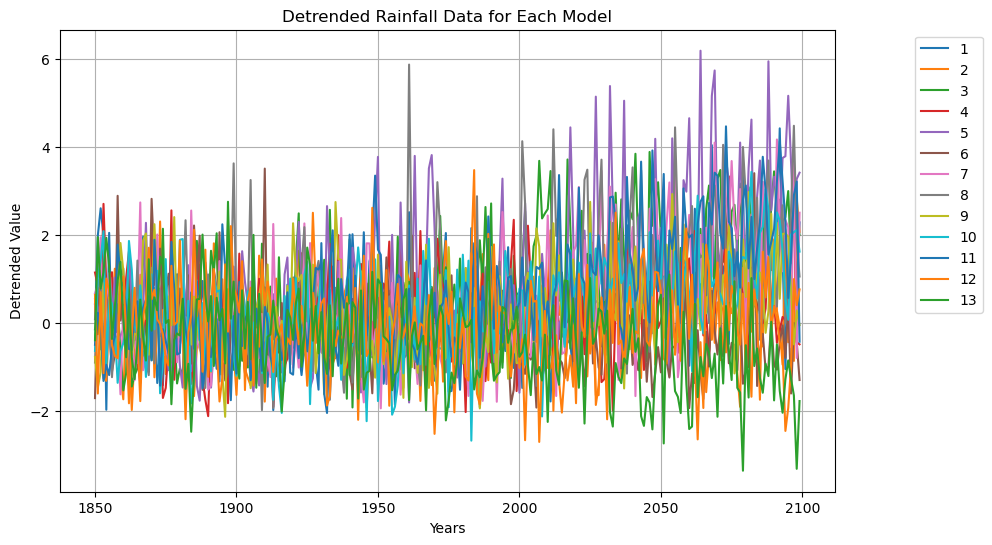

In [32]:
plt.figure(figsize=(10, 6))

for col in rainfall_yearly.columns: 
    plt.plot(rainfall_yearly[col], label=col)
plt.xlabel('Years')
plt.ylabel('Detrended Value')
plt.title('Detrended Rainfall Data for Each Model')
plt.legend(loc='upper right', bbox_to_anchor=(1.2, 1))
plt.grid(True)
plt.show()

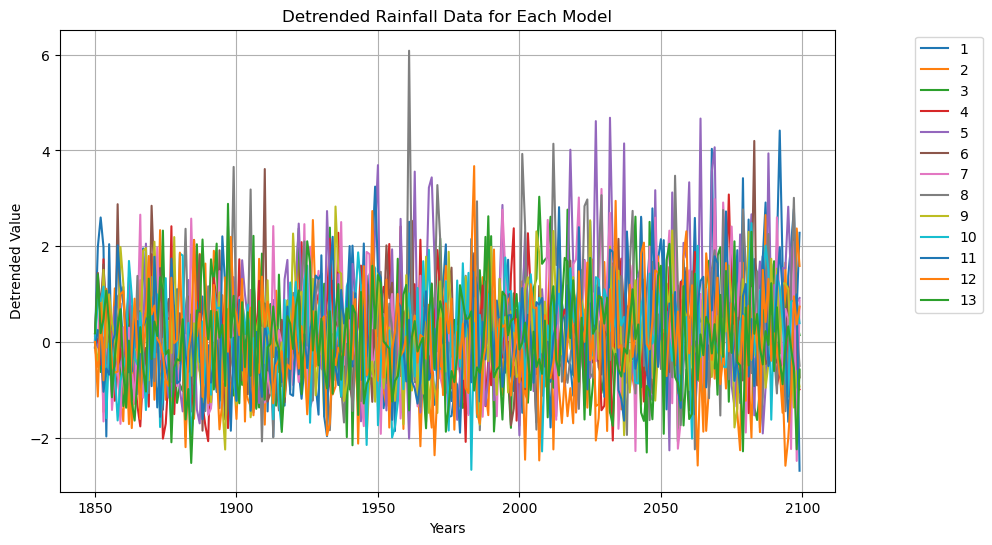

In [33]:
plt.figure(figsize=(10, 6))

for col in detrended_rainfall_yearly.columns: 
    plt.plot(detrended_rainfall_yearly[col], label=col)
plt.xlabel('Years')
plt.ylabel('Detrended Value')
plt.title('Detrended Rainfall Data for Each Model')
plt.legend(loc='upper right', bbox_to_anchor=(1.2, 1))
plt.grid(True)
plt.show()

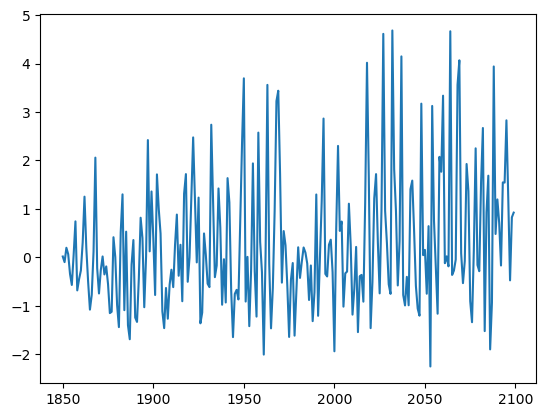

In [34]:
plt.plot(detrended_rainfall_yearly.iloc[:,4])

In [35]:
mod_ids = range(0, rainfall_yearly.shape[1])
mod_ids_train = range(0, rainfall_yearly.shape[1]-1)
year = np.array(rainfall_yearly.index)

# periodic analysis

In [36]:
# Function to plot and return the top 3 periodicities for each method
def analyze_periodicity(data):
    results = {}
    
    # Convert data to numpy array for FFT
    data = np.asarray(data)
    
    # Fourier Transform
    N = len(data)
    T = 1.0
    yf = fft(data)
    xf = np.fft.fftfreq(N, T)[:N//2]
    fft_amplitudes = 2.0/N * np.abs(yf[0:N//2])
    
    # Avoid division by zero
    non_zero_freqs = xf != 0
    xf = xf[non_zero_freqs]
    fft_amplitudes = fft_amplitudes[non_zero_freqs]
    
    fft_peaks = np.argsort(fft_amplitudes)[-3:]
    fft_periods = 1 / xf[fft_peaks]
    results['FFT'] = fft_periods
    
    # Wavelet Transform
    widths = np.arange(1, 31)
    cwt_matr = pywt.cwt(data, widths, 'mexh')[0]
    wavelet_power = np.sum(cwt_matr**2, axis=1)
    wavelet_peaks = np.argsort(wavelet_power)[-3:]
    wavelet_periods = widths[wavelet_peaks]
    results['Wavelet'] = wavelet_periods
    
    # Autocorrelation
    autocorr = acf(data, nlags=N//2)
    autocorr_peaks = np.argsort(autocorr)[-3:]
    results['Autocorrelation'] = autocorr_peaks
    
    # Power Spectral Density
    freqs, psd = periodogram(data)
    non_zero_freqs = freqs != 0
    freqs = freqs[non_zero_freqs]
    psd = psd[non_zero_freqs]
    
    psd_peaks = np.argsort(psd)[-3:]
    psd_periods = 1 / freqs[psd_peaks]
    results['PSD'] = psd_periods
    
    return results

# Perform the analysis for each of the 16 models
all_results = []
for col in detrended_rainfall_yearly.columns:
    data = detrended_rainfall_yearly[col]
    results = analyze_periodicity(data)
    all_results.append(results)

# Aggregate and print the results
for method in ['FFT', 'Wavelet', 'Autocorrelation', 'PSD']:
    print(f"Top 3 periodicities for {method}:")
    for i, result in enumerate(all_results):
        print(f"Model {i+1}: {result[method]}")
    print("\n")

Top 3 periodicities for FFT:
Model 1: [  2.03252033 125.         250.        ]
Model 2: [3.57142857 3.125      4.90196078]
Model 3: [27.77777778  2.97619048  2.29357798]
Model 4: [  7.8125       2.10084034 125.        ]
Model 5: [4.54545455 4.38596491 5.        ]
Model 6: [2.47524752 6.41025641 2.27272727]
Model 7: [  2.90697674 250.           2.63157895]
Model 8: [ 2.94117647 10.          5.20833333]
Model 9: [ 3.08641975 83.33333333  2.3364486 ]
Model 10: [2.04918033 4.80769231 4.62962963]
Model 11: [5.20833333 3.67647059 5.43478261]
Model 12: [2.90697674 5.         5.43478261]
Model 13: [ 2.23214286  4.71698113 17.85714286]


Top 3 periodicities for Wavelet:
Model 1: [28 29 30]
Model 2: [12 13 14]
Model 3: [6 8 7]
Model 4: [28 29 30]
Model 5: [28 29 30]
Model 6: [26 25 24]
Model 7: [28 29 30]
Model 8: [3 1 2]
Model 9: [20 18 19]
Model 10: [7 5 6]
Model 11: [18 20 19]
Model 12: [22 23 24]
Model 13: [2 4 3]


Top 3 periodicities for Autocorrelation:
Model 1: [6 4 0]
Model 2: [114   3 

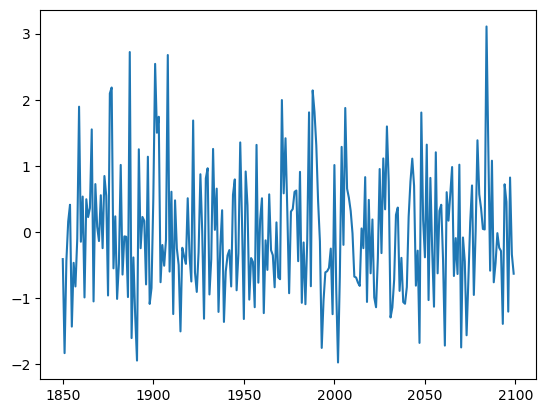

In [37]:
plt.plot(rainfall_yearly_test.iloc[:,4])

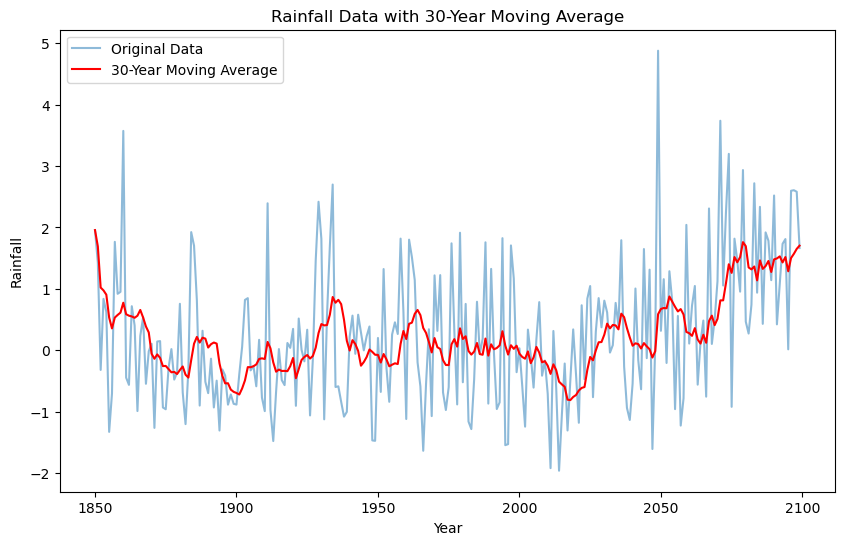

In [38]:
rainfall_smoothed = rainfall_yearly_test.iloc[:, 2].rolling(window=10, min_periods=1).mean()

plt.figure(figsize=(10, 6))
plt.plot(rainfall_yearly_test.iloc[:, 2], label='Original Data', alpha=0.5)
plt.plot(rainfall_smoothed, label='30-Year Moving Average', color='red')
plt.xlabel('Year')
plt.ylabel('Rainfall')
plt.title('Rainfall Data with 30-Year Moving Average')
plt.legend()
plt.show()


# Function

In [39]:
def tune_GPR(mod_ids, Nobs, data, pbounds, kernel_func):
    def gp_target(**params):
        total_lml = 0.0
        for mod_id in mod_ids:
            if mod_id >= data.shape[1]:
                print(f"mod_id {mod_id} is out of bounds for data with {data.shape[1]} columns.")
                continue
            try:
                oos_gcm = data.iloc[:, mod_id].values
            except IndexError as e:
                print(f"IndexError for mod_id {mod_id}: {e}")
                continue

            X_train = np.arange(Nobs).reshape(-1, 1)
            y_train = oos_gcm[:Nobs]

            try:
                kernel = kernel_func(params)
                gp = GaussianProcessRegressor(kernel=kernel, optimizer=None)
                gp.fit(X_train, y_train)
                lml = gp.log_marginal_likelihood()
                if np.isreal(lml):
                    total_lml += lml
                else:
                    total_lml -= np.inf
            except (TypeError, np.linalg.LinAlgError) as e:
                print("Error in kernel construction or GP fitting:", e)
                total_lml -= np.inf

        return total_lml
    
    optimizer = BayesianOptimization(f=gp_target, pbounds=pbounds, random_state=90)
    init_points = 500
    n_iter = 500

    with tqdm(total=init_points + n_iter, desc="Optimization Progress") as pbar:
        try:
            optimizer.maximize(init_points=init_points, n_iter=n_iter)
            pbar.update(init_points + n_iter)
        except Exception as e:
            print("An error occurred during optimization:", e)
            if 'params' in optimizer.max:
                best_params = optimizer.max['params']
                print("Best parameters found during the optimization process: ", best_params)
                kernel = kernel_func(best_params)
                best_total_lml = gp_target(**best_params)
                print("Total log marginal likelihood for best parameters found during the optimization process: ", best_total_lml)
                return kernel
            else:
                print("No valid parameters found during the optimization process.")
                return None

    try:
        best_params = optimizer.max['params']
        print("Best parameters found: ", best_params)
        kernel = kernel_func(best_params)
        
        return kernel
    except KeyError:
        print("No valid parameters found after the optimization process.")
        return None
    
    
def log_marginal_likelihood_partial(gp, X, y):
    """
    Compute the log marginal likelihood for a given subset of data using a fitted Gaussian Process.
    """
    K = gp.kernel_(X)
    K[np.diag_indices_from(K)] += gp.alpha
    L = np.linalg.cholesky(K)
    alpha = np.linalg.solve(L.T, np.linalg.solve(L, y))
    
    log_likelihood = -0.5 * np.dot(y.T, alpha)
    log_likelihood -= np.sum(np.log(np.diag(L)))
    log_likelihood -= len(X) / 2 * np.log(2 * np.pi)
    
    return log_likelihood

def GPR_func_sklearn(mod_ids, Nobs, data, best_kernel, virtualobs):
    np.float = np.float64
    total_lml_train = 0.0
    total_lml_test = 0.0
    total_lml_full = 0.0
    
    for mod_id in mod_ids:
        if mod_id >= data.shape[1]:
            print(f"mod_id {mod_id} is out of bounds for data with {data.shape[1]} columns.")
            continue
        
        try:
            oos_gcm = data.iloc[:, mod_id].values
        except IndexError as e:
            print(f"IndexError for mod_id {mod_id}: {e}")
            continue

        X_train = np.arange(Nobs).reshape(-1, 1)
        y_train = oos_gcm[:Nobs]
        X_test = np.arange(Nobs, len(data)).reshape(-1, 1)
        y_test = oos_gcm[Nobs:]
        X_full = np.arange(len(data)).reshape(-1, 1)
        y_full = oos_gcm

        gp = GaussianProcessRegressor(kernel=best_kernel, optimizer=None)
        gp.fit(X_train, y_train)
        lml_train = gp.log_marginal_likelihood()
        if np.isreal(lml_train):
            total_lml_train += lml_train
        else:
            total_lml_train -= np.inf

        lml_test = log_marginal_likelihood_partial(gp, X_test, y_test)
        if np.isreal(lml_test):
            total_lml_test += lml_test
        else:
            total_lml_test -= np.inf

        lml_full = log_marginal_likelihood_partial(gp, X_full, y_full)
        if np.isreal(lml_full):
            total_lml_full += lml_full
        else:
            total_lml_full -= np.inf


    X_train = np.arange(Nobs).reshape(-1, 1)
    y_train = virtualobs[:Nobs]
    X_full = np.arange(len(data)).reshape(-1, 1)
    y_full = virtualobs
    gp = GaussianProcessRegressor(kernel=best_kernel, optimizer=None)
    gp.fit(X_train, y_train)
    print("best kernel is:", gp.kernel_)
    
    lml_train = gp.log_marginal_likelihood()
    lml_test = log_marginal_likelihood_partial(gp, X_test, y_test)
    lml_full = log_marginal_likelihood_partial(gp, X_full, y_full)

        
    prior_mu = np.mean(data, axis=1)
    prior_cov = gp.kernel_(X_full, X_full)
    post_mu, post_cov = gp.predict(X_full, return_cov=True)
    return prior_mu, prior_cov, post_mu, post_cov

    
def plot_gpr_results(mod_ids, Nobs, data, best_kernel, virtualobs):
    prior_mu, prior_cov, post_mu, post_cov = GPR_func_sklearn(mod_ids, Nobs, data, best_kernel, virtualobs)
    prior_std = np.sqrt(np.diag(prior_cov))
    post_std = np.sqrt(np.diag(post_cov))
    # prior_mu_obs = prior_mu[:Nobs]
    def rgb_to_normalized(rgb):
        return [x / 255.0 for x in rgb]
    
    plt.figure(figsize=(10, 6))
    # plt.plot(np.arange(Nobs), prior_mu_obs, 'k', lw=1, label='Prior Observation Mean')
    plt.fill_between(year, prior_mu - 1.64 * prior_std, prior_mu + 1.64 * prior_std, alpha=0.15, color='grey')
    t_pred = np.arange(len(data))
    post_mu_pred = post_mu
    post_std_pred = post_std
    
    plt.axvline(x=year[Nobs], color='grey', linestyle='--', label='History/Future Split')
    # plt.plot(rainfall_yearly, alpha=0.05,lw=2, color='grey') #imitate prior region
    plt.fill_between(year, post_mu_pred - 1.64 * post_std_pred, post_mu_pred + 1.64 * post_std_pred, alpha=0.2, color=rgb_to_normalized((147, 148, 231)), label='90% Posterior Mean')
    plt.plot(year, prior_mu, 'grey', lw=2, label='Prior Mean',alpha=0.5)
    plt.plot(year, virtualobs, color=rgb_to_normalized((243, 210, 102)), lw=2, label='Virtual Observation',alpha=0.6)
    plt.plot(year, post_mu_pred, color=rgb_to_normalized((147, 148, 231)), lw=2, label='Posterior Mean',alpha=1)
    
    
    plt.legend()
    plt.xlabel("Year")
    plt.ylabel("Values")
    # plt.ylim(-6, 6)
    plt.title(f'Prediction with {Nobs} years for observation')
    plt.show()
    
def gpr_model(mod_ids, Nobs, data, pbounds, kernel_func, virtualobs):
    np.float = np.float64
    best_kernel = tune_GPR(mod_ids, Nobs, data, pbounds, kernel_func)
    plot_gpr_results(mod_ids, Nobs, data, best_kernel, virtualobs)
    
def plot_prior_posterior(X, obs, prior_mu, prior_cov, post_mu, post_cov):
    std_prior = np.sqrt(np.diag(prior_cov))
    std_post = np.sqrt(np.diag(post_cov))
    
    def rgb_to_normalized(rgb):
        return [x / 255.0 for x in rgb]
    
    plt.figure(figsize=(10, 6))
    plt.fill_between(X.flatten(), post_mu - 1.96*std_post, post_mu + 1.96*std_post, alpha=0.2, color=rgb_to_normalized((241, 215, 126)), label='Posterior 95% CI')
    plt.plot(X, obs, color=rgb_to_normalized((191, 177, 208)), label='Virtual Observation')
    plt.plot(X, prior_mu, color=rgb_to_normalized((255, 235, 173)), label='Prior Mean')
    # plt.fill_between(X.flatten(), prior_mu - 1.96*std_prior, prior_mu + 1.96*std_prior, alpha=0.2, color='blue', label='Prior 95% CI')
    plt.plot(X, post_mu, color=rgb_to_normalized((164, 81, 79)), label='Posterior Mean')
    plt.axvline(x=year[Nobs], color='grey', linestyle='--', label='Historical/Future Split')
    plt.title('Prior vs Posterior')
    plt.xlabel('X')
    plt.ylabel('y')
    plt.legend()
    plt.show()
    #(130, 176, 210)

# Kernel Selection

Test different kernels. Note that '_' means the sum of kernel, and kernel1kernel2 means kernel1*kernel2. Number means how many kernels we use of the same structure.

With other kernels to be implementation. Such as some kernels to make an addition or product.

## rbf*pe

Optimization Progress:   0%|          | 0/1000 [00:00<?, ?it/s]

|   iter    |  target   |    c2     |    c3     |    c4     |   c_rbf   |    ls1    |    ls2    |    ls3    |   noise   |   per1    |   per2    |   per3    |  rbf_ls3  |
-------------------------------------------------------------------------------------------------------------------------------------------------------------------------
| 1         | -3.576e+0 | 0.3908    | 2.315     | 3.971     | 0.4618    | 2.675     | 3.409     | 4.006     | 0.006801  | 4.006     | 29.54     | 29.32     | 11.19     |
| 2         | -3.239e+0 | 0.7988    | 2.516     | 2.389     | 0.321     | 8.431     | 5.531     | 7.188     | 0.007836  | 5.569     | 28.54     | 27.32     | 13.07     |
| 3         | -3.748e+0 | 1.642     | 2.102     | 3.189     | 0.4873    | 9.876     | 8.378     | 7.209     | 0.006609  | 5.397     | 29.73     | 30.35     | 9.6       |
| 4         | -5.132e+0 | 1.141     | 3.913     | 2.568     | 0.2937    | 8.318     | 6.461     | 6.717     | 0.00475   | 6.125     | 28.22     | 30.0

Optimization Progress: 100%|██████████| 1000/1000 [26:36<00:00,  1.60s/it]

| 1000      | -2.105e+0 | 2.0       | 2.0       | 2.0       | 0.5       | 3.104     | 2.511     | 1.0       | 0.01      | 3.0       | 31.0      | 29.14     | 14.27     |
Best parameters found:  {'c2': 2.0, 'c3': 3.7985249954006517, 'c4': 2.3896882768445296, 'c_rbf': 0.1, 'ls1': 1.0, 'ls2': 1.0, 'ls3': 1.0, 'noise': 0.01, 'per1': 4.615346804051604, 'per2': 27.0, 'per3': 30.43332293578619, 'rbf_ls3': 15.0}


best kernel is: 1.41**2 * ExpSineSquared(length_scale=1, periodicity=4.62) + 1.95**2 * ExpSineSquared(length_scale=1, periodicity=27) + 1.55**2 * ExpSineSquared(length_scale=1, periodicity=30.4) + 0.316**2 * RBF(length_scale=15) + WhiteKernel(noise_level=0.01)


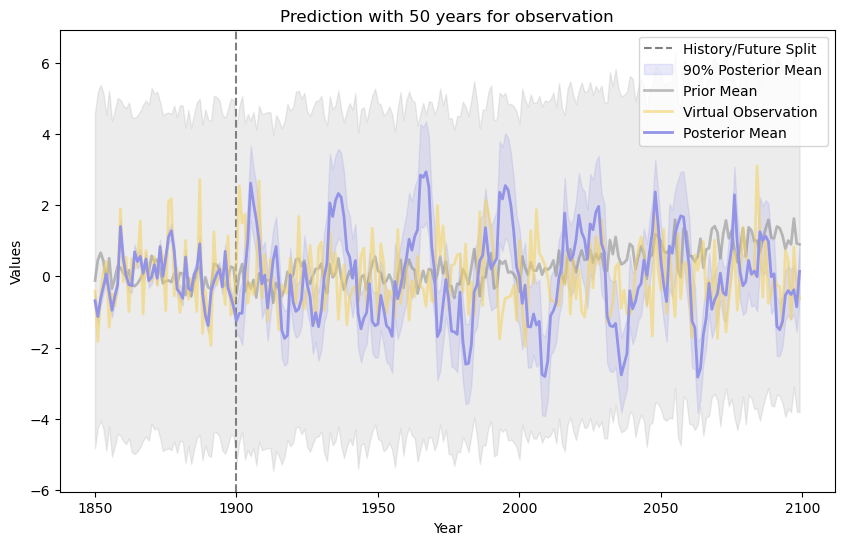

Optimization Progress:   0%|          | 0/1000 [00:00<?, ?it/s]

|   iter    |  target   |    c2     |    c3     |    c4     |   c_rbf   |    ls1    |    ls2    |    ls3    |   noise   |   per1    |   per2    |   per3    |  rbf_ls3  |
-------------------------------------------------------------------------------------------------------------------------------------------------------------------------
| 1         | -7.439e+0 | 0.3908    | 2.315     | 3.971     | 0.4618    | 2.675     | 3.409     | 4.006     | 0.006801  | 4.006     | 29.54     | 29.32     | 11.19     |
| 2         | -6.74e+04 | 0.7988    | 2.516     | 2.389     | 0.321     | 8.431     | 5.531     | 7.188     | 0.007836  | 5.569     | 28.54     | 27.32     | 13.07     |
| 3         | -7.742e+0 | 1.642     | 2.102     | 3.189     | 0.4873    | 9.876     | 8.378     | 7.209     | 0.006609  | 5.397     | 29.73     | 30.35     | 9.6       |
| 4         | -1.05e+05 | 1.141     | 3.913     | 2.568     | 0.2937    | 8.318     | 6.461     | 6.717     | 0.00475   | 6.125     | 28.22     | 30.0

Optimization Progress: 100%|██████████| 1000/1000 [26:48<00:00,  1.61s/it]

| 1000      | -4.848e+0 | 2.0       | 4.0       | 4.0       | 0.1       | 6.387     | 1.0       | 5.384     | 0.01      | 7.0       | 31.0      | 31.0      | 12.56     |
Best parameters found:  {'c2': 0.6190060084024064, 'c3': 4.0, 'c4': 4.0, 'c_rbf': 0.5, 'ls1': 1.0, 'ls2': 1.0, 'ls3': 1.0, 'noise': 0.01, 'per1': 6.38282543807712, 'per2': 30.15202670969691, 'per3': 27.012542656658972, 'rbf_ls3': 13.265751212961188}


best kernel is: 0.787**2 * ExpSineSquared(length_scale=1, periodicity=6.38) + 2**2 * ExpSineSquared(length_scale=1, periodicity=30.2) + 2**2 * ExpSineSquared(length_scale=1, periodicity=27) + 0.707**2 * RBF(length_scale=13.3) + WhiteKernel(noise_level=0.01)


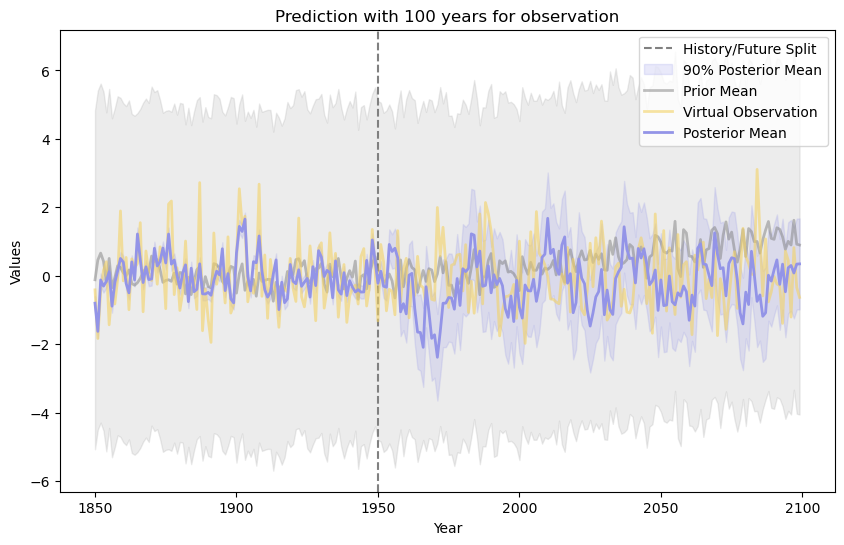

Optimization Progress:   0%|          | 0/1000 [00:00<?, ?it/s]

|   iter    |  target   |    c2     |    c3     |    c4     |   c_rbf   |    ls1    |    ls2    |    ls3    |   noise   |   per1    |   per2    |   per3    |  rbf_ls3  |
-------------------------------------------------------------------------------------------------------------------------------------------------------------------------
| 1         | -1.206e+0 | 0.3908    | 2.315     | 3.971     | 0.4618    | 2.675     | 3.409     | 4.006     | 0.006801  | 4.006     | 29.54     | 29.32     | 11.19     |
| 2         | -1.075e+0 | 0.7988    | 2.516     | 2.389     | 0.321     | 8.431     | 5.531     | 7.188     | 0.007836  | 5.569     | 28.54     | 27.32     | 13.07     |
| 3         | -1.24e+05 | 1.642     | 2.102     | 3.189     | 0.4873    | 9.876     | 8.378     | 7.209     | 0.006609  | 5.397     | 29.73     | 30.35     | 9.6       |
| 4         | -1.695e+0 | 1.141     | 3.913     | 2.568     | 0.2937    | 8.318     | 6.461     | 6.717     | 0.00475   | 6.125     | 28.22     | 30.0

Optimization Progress: 100%|██████████| 1000/1000 [26:49<00:00,  1.61s/it]

| 1000      | -6.952e+0 | 2.0       | 3.655     | 4.0       | 0.1       | 1.96      | 10.0      | 1.0       | 0.01      | 6.48      | 27.0      | 31.0      | 5.0       |
Best parameters found:  {'c2': 2.0, 'c3': 4.0, 'c4': 3.932149725677493, 'c_rbf': 0.5, 'ls1': 4.720903663457955, 'ls2': 10.0, 'ls3': 1.0, 'noise': 0.01, 'per1': 4.790417017613027, 'per2': 27.0, 'per3': 30.4378260464101, 'rbf_ls3': 5.0}


best kernel is: 1.41**2 * ExpSineSquared(length_scale=4.72, periodicity=4.79) + 2**2 * ExpSineSquared(length_scale=10, periodicity=27) + 1.98**2 * ExpSineSquared(length_scale=1, periodicity=30.4) + 0.707**2 * RBF(length_scale=5) + WhiteKernel(noise_level=0.01)


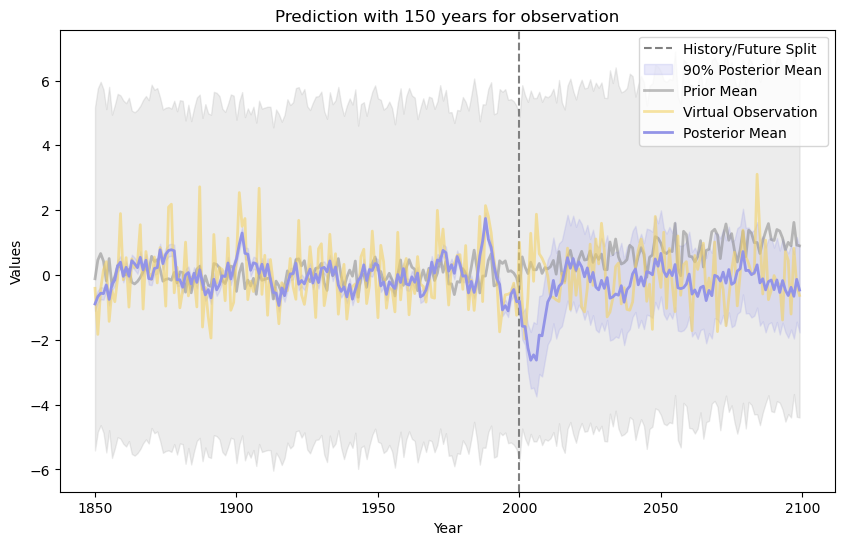

Optimization Progress:   0%|          | 0/1000 [00:00<?, ?it/s]

|   iter    |  target   |    c2     |    c3     |    c4     |   c_rbf   |    ls1    |    ls2    |    ls3    |   noise   |   per1    |   per2    |   per3    |  rbf_ls3  |
-------------------------------------------------------------------------------------------------------------------------------------------------------------------------
| 1         | -1.702e+0 | 0.3908    | 2.315     | 3.971     | 0.4618    | 2.675     | 3.409     | 4.006     | 0.006801  | 4.006     | 29.54     | 29.32     | 11.19     |
| 2         | -1.521e+0 | 0.7988    | 2.516     | 2.389     | 0.321     | 8.431     | 5.531     | 7.188     | 0.007836  | 5.569     | 28.54     | 27.32     | 13.07     |
| 3         | -1.75e+05 | 1.642     | 2.102     | 3.189     | 0.4873    | 9.876     | 8.378     | 7.209     | 0.006609  | 5.397     | 29.73     | 30.35     | 9.6       |
| 4         | -2.414e+0 | 1.141     | 3.913     | 2.568     | 0.2937    | 8.318     | 6.461     | 6.717     | 0.00475   | 6.125     | 28.22     | 30.0

Optimization Progress: 100%|██████████| 1000/1000 [27:18<00:00,  1.64s/it]

| 1000      | -1.088e+0 | 0.8134    | 2.292     | 2.0       | 0.1       | 10.0      | 1.0       | 10.0      | 0.01      | 3.0       | 27.0      | 29.05     | 6.935     |
Best parameters found:  {'c2': 0.1, 'c3': 2.0, 'c4': 2.0, 'c_rbf': 0.5, 'ls1': 1.0, 'ls2': 10.0, 'ls3': 1.0, 'noise': 0.01, 'per1': 5.0420049787130425, 'per2': 28.74675620039309, 'per3': 31.0, 'rbf_ls3': 5.0}


best kernel is: 0.316**2 * ExpSineSquared(length_scale=1, periodicity=5.04) + 1.41**2 * ExpSineSquared(length_scale=10, periodicity=28.7) + 1.41**2 * ExpSineSquared(length_scale=1, periodicity=31) + 0.707**2 * RBF(length_scale=5) + WhiteKernel(noise_level=0.01)


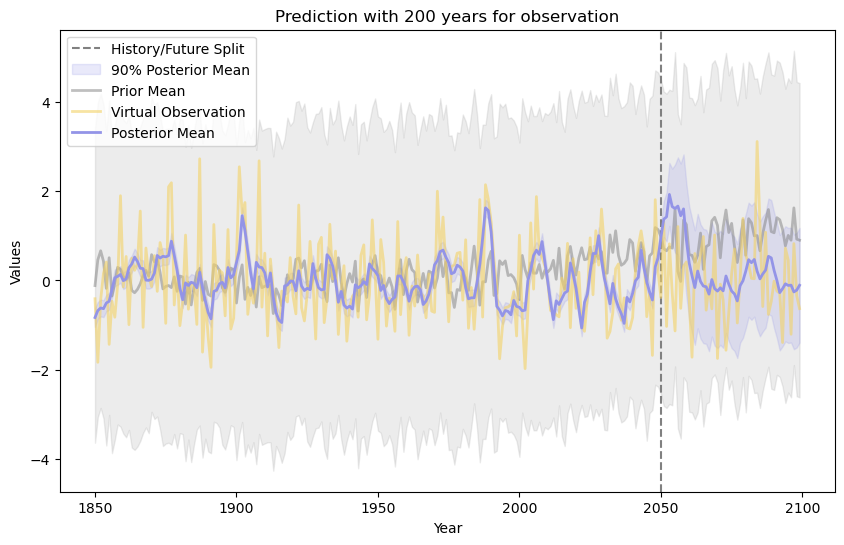

In [42]:
def pe3_rbf(best_params):
    kernel = (
        C(best_params['c2']) * ExpSineSquared(length_scale=best_params['ls1'], periodicity=best_params['per1']) +
        C(best_params['c3']) * ExpSineSquared(length_scale=best_params['ls2'], periodicity=best_params['per2'])+
        C(best_params['c4']) * ExpSineSquared(length_scale=best_params['ls3'], periodicity=best_params['per3'])+
        C(best_params['c_rbf']) * RBF(length_scale=best_params['rbf_ls3']) +
        WhiteKernel(noise_level=best_params['noise'])
    )
    return kernel

pbounds = {
    'c2': (1e-1, 2),
    'c3': (2, 4),
    'c4': (2, 4),
    'c_rbf': (1e-1, 0.5),    
    'ls1': (1, 10),
    'per1': (3, 7),
    'ls2': (1, 10),
    'per2': (27, 31),
    'ls3': (1, 10),
    'per3': (27, 31),
    'rbf_ls3': (5, 15),    
    'noise': (1e-3, 1e-2),
}


Nobs=50
gpr_model(mod_ids, Nobs, rainfall_yearly, pbounds, pe3_rbf, rainfall_yearly_test.iloc[:, 4])
Nobs=100
gpr_model(mod_ids, Nobs, rainfall_yearly, pbounds, pe3_rbf, rainfall_yearly_test.iloc[:, 4])
Nobs=150
gpr_model(mod_ids, Nobs, rainfall_yearly, pbounds, pe3_rbf, rainfall_yearly_test.iloc[:, 4])
Nobs=200
gpr_model(mod_ids, Nobs, rainfall_yearly, pbounds, pe3_rbf, rainfall_yearly_test.iloc[:, 4])


Optimization Progress:   0%|          | 0/1000 [00:00<?, ?it/s]

|   iter    |  target   |    c2     |    c3     |   c_rbf   |    ls1    |    ls2    |   noise   |   per1    |   per2    |  rbf_ls3  |
-------------------------------------------------------------------------------------------------------------------------------------
| 1         | -8.724e+0 | 1.153     | 1.158     | 0.9869    | 9.14      | 2.675     | 0.002678  | 4.336     | 29.58     | 7.514     |
| 2         | -1.199e+0 | 1.635     | 1.58      | 0.6569    | 4.31      | 3.324     | 0.001944  | 5.21      | 30.3      | 10.03     |
| 3         | -2.698e+0 | 1.688     | 1.76      | 0.6781    | 4.465     | 1.721     | 0.008075  | 6.246     | 27.2      | 10.94     |
| 4         | -4.041e+0 | 1.968     | 1.986     | 0.8378    | 7.209     | 6.609     | 0.005993  | 5.726     | 30.35     | 9.6       |
| 5         | -4.195e+0 | 1.548     | 1.956     | 0.3556    | 5.359     | 8.318     | 0.006069  | 5.541     | 28.67     | 12.81     |
| 6         | -5.739e+0 | 1.304     | 1.76      | 0.4599    | 

Optimization Progress: 100%|██████████| 1000/1000 [19:41<00:00,  1.18s/it]

| 1000      | -2.367e+0 | 1.539     | 1.253     | 0.1076    | 2.15      | 3.552     | 0.01      | 5.141     | 28.32     | 9.045     |
Best parameters found:  {'c2': 1.2956114202529738, 'c3': 1.575724800733913, 'c_rbf': 0.8020272677878973, 'ls1': 4.654807893768544, 'ls2': 1.34319947375434, 'noise': 0.009957839442831549, 'per1': 5.736361483965037, 'per2': 28.389904775837078, 'rbf_ls3': 7.382456364026018}


best kernel is: 1.14**2 * ExpSineSquared(length_scale=4.65, periodicity=5.74) + 1.26**2 * ExpSineSquared(length_scale=1.34, periodicity=28.4) + 0.896**2 * RBF(length_scale=7.38) + WhiteKernel(noise_level=0.00996)


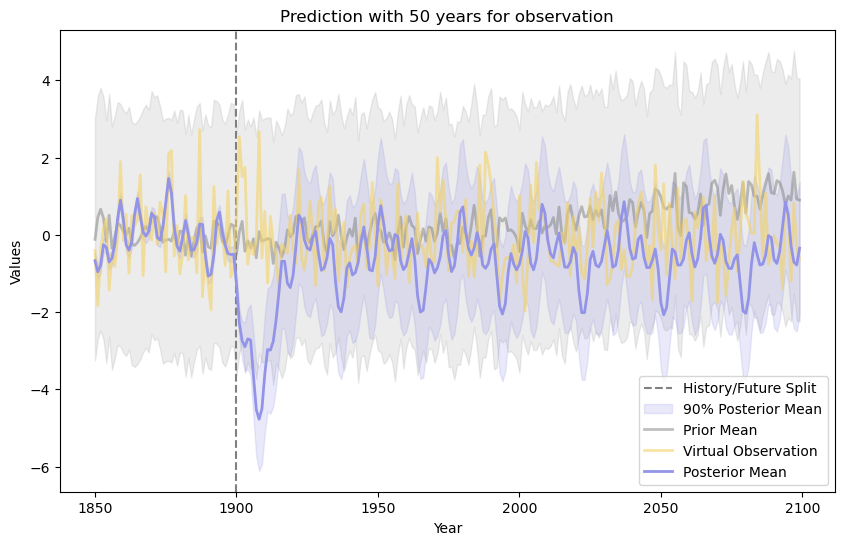

Optimization Progress:   0%|          | 0/1000 [00:00<?, ?it/s]

|   iter    |  target   |    c2     |    c3     |   c_rbf   |    ls1    |    ls2    |   noise   |   per1    |   per2    |  rbf_ls3  |
-------------------------------------------------------------------------------------------------------------------------------------
| 1         | -1.78e+05 | 1.153     | 1.158     | 0.9869    | 9.14      | 2.675     | 0.002678  | 4.336     | 29.58     | 7.514     |
| 2         | -2.521e+0 | 1.635     | 1.58      | 0.6569    | 4.31      | 3.324     | 0.001944  | 5.21      | 30.3      | 10.03     |
| 3         | -5.922e+0 | 1.688     | 1.76      | 0.6781    | 4.465     | 1.721     | 0.008075  | 6.246     | 27.2      | 10.94     |
| 4         | -8.389e+0 | 1.968     | 1.986     | 0.8378    | 7.209     | 6.609     | 0.005993  | 5.726     | 30.35     | 9.6       |
| 5         | -8.704e+0 | 1.548     | 1.956     | 0.3556    | 5.359     | 8.318     | 0.006069  | 5.541     | 28.67     | 12.81     |
| 6         | -1.207e+0 | 1.304     | 1.76      | 0.4599    | 

Optimization Progress: 100%|██████████| 1000/1000 [20:22<00:00,  1.22s/it]

| 1000      | -5.147e+0 | 1.0       | 1.089     | 0.175     | 3.451     | 3.18      | 0.01      | 5.583     | 29.74     | 10.41     |
Best parameters found:  {'c2': 1.2449517073931018, 'c3': 1.429493781789233, 'c_rbf': 0.439159715498632, 'ls1': 1.6225666583211102, 'ls2': 2.1906290340938783, 'noise': 0.009871611770079362, 'per1': 4.525670805481827, 'per2': 28.308254363763826, 'rbf_ls3': 7.6743508530521956}


best kernel is: 1.12**2 * ExpSineSquared(length_scale=1.62, periodicity=4.53) + 1.2**2 * ExpSineSquared(length_scale=2.19, periodicity=28.3) + 0.663**2 * RBF(length_scale=7.67) + WhiteKernel(noise_level=0.00987)


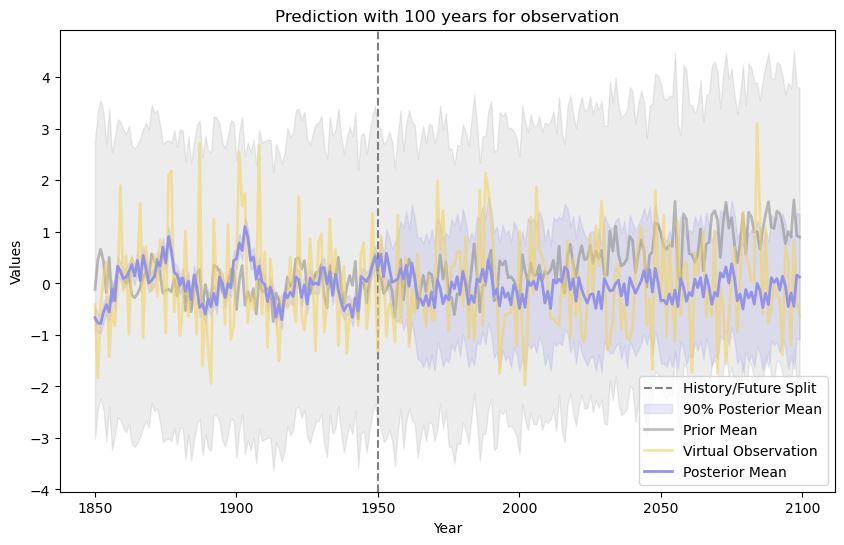

Optimization Progress:   0%|          | 0/1000 [00:00<?, ?it/s]

|   iter    |  target   |    c2     |    c3     |   c_rbf   |    ls1    |    ls2    |   noise   |   per1    |   per2    |  rbf_ls3  |
-------------------------------------------------------------------------------------------------------------------------------------
| 1         | -2.847e+0 | 1.153     | 1.158     | 0.9869    | 9.14      | 2.675     | 0.002678  | 4.336     | 29.58     | 7.514     |
| 2         | -4.088e+0 | 1.635     | 1.58      | 0.6569    | 4.31      | 3.324     | 0.001944  | 5.21      | 30.3      | 10.03     |
| 3         | -9.751e+0 | 1.688     | 1.76      | 0.6781    | 4.465     | 1.721     | 0.008075  | 6.246     | 27.2      | 10.94     |
| 4         | -1.363e+0 | 1.968     | 1.986     | 0.8378    | 7.209     | 6.609     | 0.005993  | 5.726     | 30.35     | 9.6       |
| 5         | -1.398e+0 | 1.548     | 1.956     | 0.3556    | 5.359     | 8.318     | 0.006069  | 5.541     | 28.67     | 12.81     |
| 6         | -1.927e+0 | 1.304     | 1.76      | 0.4599    | 

Optimization Progress: 100%|██████████| 1000/1000 [20:45<00:00,  1.25s/it]

| 1000      | -8.189e+0 | 1.571     | 1.0       | 0.3053    | 4.431     | 5.152     | 0.01      | 4.914     | 28.07     | 9.869     |
Best parameters found:  {'c2': 1.2171855090006813, 'c3': 1.4041737411958195, 'c_rbf': 0.9981867634766384, 'ls1': 2.338455634240079, 'ls2': 2.5414209090027104, 'noise': 0.009363646675121044, 'per1': 6.1052869911216, 'per2': 27.107811899498454, 'rbf_ls3': 6.003695650074432}


best kernel is: 1.1**2 * ExpSineSquared(length_scale=2.34, periodicity=6.11) + 1.18**2 * ExpSineSquared(length_scale=2.54, periodicity=27.1) + 0.999**2 * RBF(length_scale=6) + WhiteKernel(noise_level=0.00936)


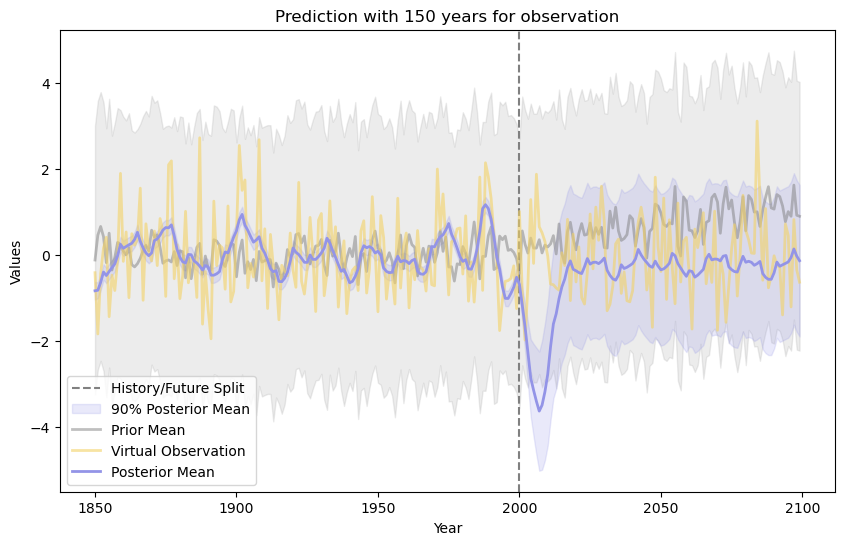

Optimization Progress:   0%|          | 0/1000 [00:00<?, ?it/s]

|   iter    |  target   |    c2     |    c3     |   c_rbf   |    ls1    |    ls2    |   noise   |   per1    |   per2    |  rbf_ls3  |
-------------------------------------------------------------------------------------------------------------------------------------
| 1         | -4.027e+0 | 1.153     | 1.158     | 0.9869    | 9.14      | 2.675     | 0.002678  | 4.336     | 29.58     | 7.514     |
| 2         | -5.803e+0 | 1.635     | 1.58      | 0.6569    | 4.31      | 3.324     | 0.001944  | 5.21      | 30.3      | 10.03     |
| 3         | -1.396e+0 | 1.688     | 1.76      | 0.6781    | 4.465     | 1.721     | 0.008075  | 6.246     | 27.2      | 10.94     |
| 4         | -1.913e+0 | 1.968     | 1.986     | 0.8378    | 7.209     | 6.609     | 0.005993  | 5.726     | 30.35     | 9.6       |
| 5         | -1.972e+0 | 1.548     | 1.956     | 0.3556    | 5.359     | 8.318     | 0.006069  | 5.541     | 28.67     | 12.81     |
| 6         | -2.715e+0 | 1.304     | 1.76      | 0.4599    | 

Optimization Progress: 100%|██████████| 1000/1000 [21:16<00:00,  1.28s/it]


| 1000      | -1.15e+05 | 1.279     | 1.769     | 0.7923    | 3.0       | 5.964     | 0.01      | 5.55      | 29.04     | 9.679     |
Best parameters found:  {'c2': 1.3565562218835965, 'c3': 1.7296206971673038, 'c_rbf': 0.6042508572267273, 'ls1': 9.949481055963298, 'ls2': 3.9746498679389513, 'noise': 0.009884712683570723, 'per1': 6.009138785025496, 'per2': 27.998369917626448, 'rbf_ls3': 6.10766663557423}
best kernel is: 1.16**2 * ExpSineSquared(length_scale=9.95, periodicity=6.01) + 1.32**2 * ExpSineSquared(length_scale=3.97, periodicity=28) + 0.777**2 * RBF(length_scale=6.11) + WhiteKernel(noise_level=0.00988)


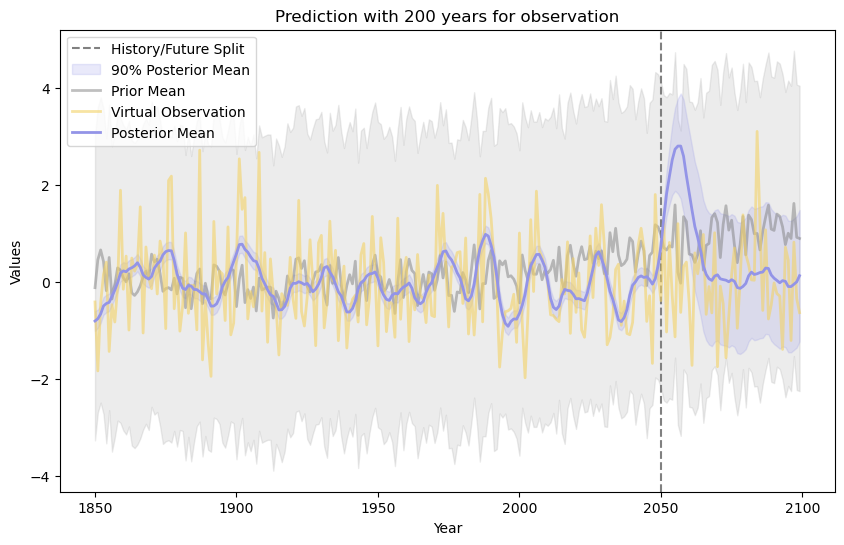

In [43]:
def pe2_rbf(best_params):
    kernel = (
        C(best_params['c2']) * ExpSineSquared(length_scale=best_params['ls1'], periodicity=best_params['per1']) +
        C(best_params['c3']) * ExpSineSquared(length_scale=best_params['ls2'], periodicity=best_params['per2'])+
        C(best_params['c_rbf']) * RBF(length_scale=best_params['rbf_ls3']) +
        WhiteKernel(noise_level=best_params['noise'])
    )
    return kernel

pbounds = {
    'c2': (1, 2),
    'c3': (1, 2),
    'c_rbf': (1e-1, 1),  
    'ls1': (1, 10),
    'per1': (3, 7),
    'ls2': (1, 10),
    'per2': (27, 31),
    'rbf_ls3': (5, 15),     
    'noise': (1e-6, 1e-2),
}

Nobs=50
gpr_model(mod_ids, Nobs, rainfall_yearly, pbounds, pe2_rbf, rainfall_yearly_test.iloc[:, 4])
Nobs=100
gpr_model(mod_ids, Nobs, rainfall_yearly, pbounds, pe2_rbf, rainfall_yearly_test.iloc[:, 4])
Nobs=150
gpr_model(mod_ids, Nobs, rainfall_yearly, pbounds, pe2_rbf, rainfall_yearly_test.iloc[:, 4])
Nobs=200
gpr_model(mod_ids, Nobs, rainfall_yearly, pbounds, pe2_rbf, rainfall_yearly_test.iloc[:, 4])

Optimization Progress:   0%|          | 0/1000 [00:00<?, ?it/s]

|   iter    |  target   |    c2     |    c3     |   c_rbf   |    ls1    |    ls2    |   noise   |   per1    |   per2    |  rbf_ls1  |  rbf_ls2  |  rbf_ls3  |
-------------------------------------------------------------------------------------------------------------------------------------------------------------
| 1         | -1.329e+0 | 0.3908    | 2.473     | 0.9869    | 9.14      | 2.675     | 0.2677    | 4.336     | 29.58     | 3.263     | 6.717     | 10.8      |
| 2         | -1.025e+0 | 1.276     | 3.103     | 0.3324    | 2.749     | 5.973     | 0.8256    | 5.014     | 29.75     | 7.836     | 6.781     | 8.85      |
| 3         | -1.031e+0 | 0.2522    | 4.422     | 0.8303    | 1.457     | 6.348     | 0.9683    | 6.945     | 30.28     | 7.209     | 6.609     | 10.99     |
| 4         | -1.288e+0 | 1.395     | 4.516     | 0.514     | 5.93      | 9.608     | 0.284     | 4.937     | 30.25     | 6.461     | 6.717     | 9.167     |
| 5         | -1.038e+0 | 1.584     | 2.913     | 0.

Optimization Progress: 100%|██████████| 1000/1000 [24:19<00:00,  1.46s/it]

| 1000      | -1.02e+03 | 0.1       | 2.996     | 1.0       | 7.334     | 3.363     | 1.0       | 4.186     | 28.35     | 4.632     | 9.954     | 5.0       |
Best parameters found:  {'c2': 0.1, 'c3': 2.0, 'c_rbf': 0.1, 'ls1': 1.8720579287314898, 'ls2': 6.777675684385639, 'noise': 1.0, 'per1': 7.0, 'per2': 27.0, 'rbf_ls1': 4.300727890871784, 'rbf_ls2': 10.0, 'rbf_ls3': 12.53939230219571}


best kernel is: 0.316**2 * ExpSineSquared(length_scale=1.87, periodicity=7) * RBF(length_scale=4.3) + 1.41**2 * ExpSineSquared(length_scale=6.78, periodicity=27) * RBF(length_scale=10) + 0.316**2 * RBF(length_scale=12.5) + WhiteKernel(noise_level=1)


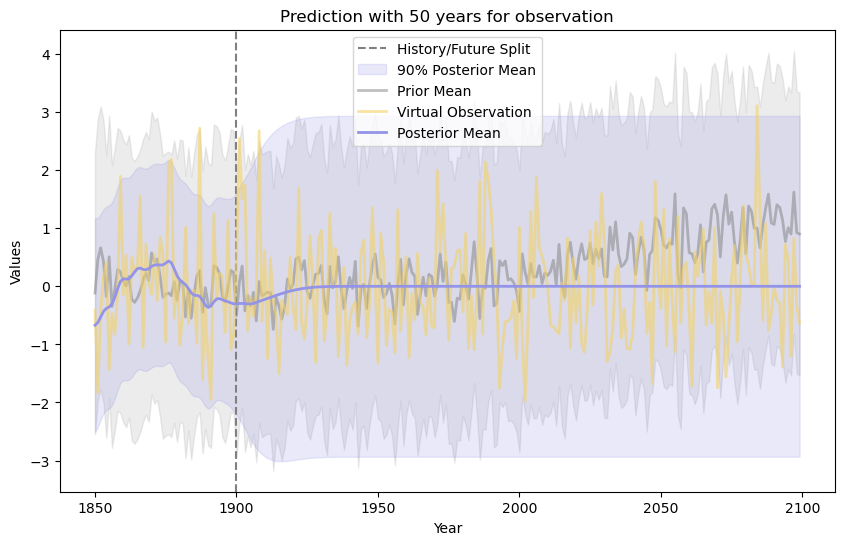

Optimization Progress:   0%|          | 0/1000 [00:00<?, ?it/s]

|   iter    |  target   |    c2     |    c3     |   c_rbf   |    ls1    |    ls2    |   noise   |   per1    |   per2    |  rbf_ls1  |  rbf_ls2  |  rbf_ls3  |
-------------------------------------------------------------------------------------------------------------------------------------------------------------
| 1         | -2.61e+03 | 0.3908    | 2.473     | 0.9869    | 9.14      | 2.675     | 0.2677    | 4.336     | 29.58     | 3.263     | 6.717     | 10.8      |
| 2         | -2.033e+0 | 1.276     | 3.103     | 0.3324    | 2.749     | 5.973     | 0.8256    | 5.014     | 29.75     | 7.836     | 6.781     | 8.85      |
| 3         | -2.044e+0 | 0.2522    | 4.422     | 0.8303    | 1.457     | 6.348     | 0.9683    | 6.945     | 30.28     | 7.209     | 6.609     | 10.99     |
| 4         | -2.54e+03 | 1.395     | 4.516     | 0.514     | 5.93      | 9.608     | 0.284     | 4.937     | 30.25     | 6.461     | 6.717     | 9.167     |
| 5         | -2.051e+0 | 1.584     | 2.913     | 0.

Optimization Progress: 100%|██████████| 1000/1000 [16:43<00:00,  1.00s/it]

| 1000      | -2.485e+0 | 0.7987    | 3.701     | 1.0       | 2.311     | 5.035     | 0.2523    | 6.295     | 29.18     | 5.12      | 9.408     | 12.82     |
Best parameters found:  {'c2': 0.3765123913002931, 'c3': 2.347120847225007, 'c_rbf': 0.24671263356360051, 'ls1': 3.8404002647100737, 'ls2': 8.994704043629731, 'noise': 0.8064454767929159, 'per1': 3.624889255589967, 'per2': 30.692531725094135, 'rbf_ls1': 6.261036454221354, 'rbf_ls2': 8.060919707218765, 'rbf_ls3': 11.59470571902167}


best kernel is: 0.614**2 * ExpSineSquared(length_scale=3.84, periodicity=3.62) * RBF(length_scale=6.26) + 1.53**2 * ExpSineSquared(length_scale=8.99, periodicity=30.7) * RBF(length_scale=8.06) + 0.497**2 * RBF(length_scale=11.6) + WhiteKernel(noise_level=0.806)


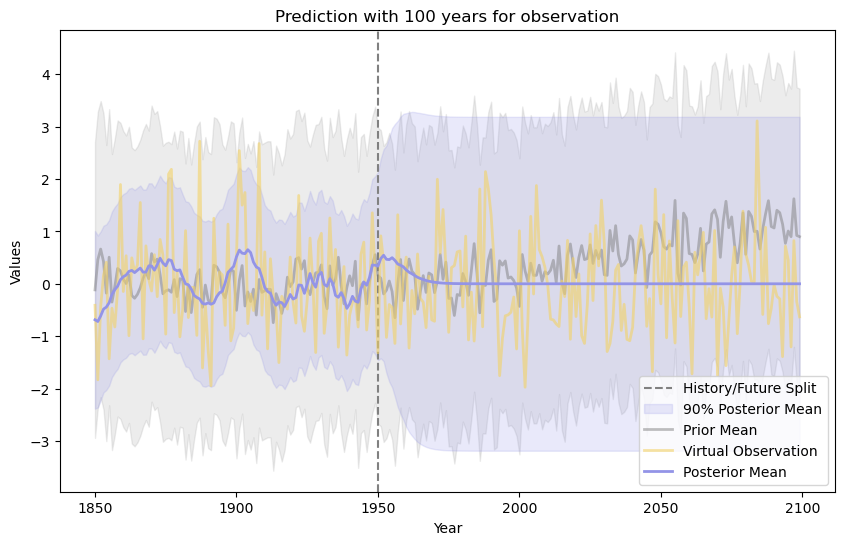

Optimization Progress:   0%|          | 0/1000 [00:00<?, ?it/s]

|   iter    |  target   |    c2     |    c3     |   c_rbf   |    ls1    |    ls2    |   noise   |   per1    |   per2    |  rbf_ls1  |  rbf_ls2  |  rbf_ls3  |
-------------------------------------------------------------------------------------------------------------------------------------------------------------
| 1         | -4.03e+03 | 0.3908    | 2.473     | 0.9869    | 9.14      | 2.675     | 0.2677    | 4.336     | 29.58     | 3.263     | 6.717     | 10.8      |
| 2         | -3.09e+03 | 1.276     | 3.103     | 0.3324    | 2.749     | 5.973     | 0.8256    | 5.014     | 29.75     | 7.836     | 6.781     | 8.85      |
| 3         | -3.102e+0 | 0.2522    | 4.422     | 0.8303    | 1.457     | 6.348     | 0.9683    | 6.945     | 30.28     | 7.209     | 6.609     | 10.99     |
| 4         | -3.936e+0 | 1.395     | 4.516     | 0.514     | 5.93      | 9.608     | 0.284     | 4.937     | 30.25     | 6.461     | 6.717     | 9.167     |
| 5         | -3.137e+0 | 1.584     | 2.913     | 0.

Optimization Progress: 100%|██████████| 1000/1000 [22:54<00:00,  1.37s/it]

| 1000      | -3.19e+03 | 2.0       | 3.259     | 0.1       | 4.531     | 5.129     | 1.0       | 5.916     | 29.07     | 3.413     | 4.999     | 8.632     |
Best parameters found:  {'c2': 0.3765123913002931, 'c3': 2.347120847225007, 'c_rbf': 0.24671263356360051, 'ls1': 3.8404002647100737, 'ls2': 8.994704043629731, 'noise': 0.8064454767929159, 'per1': 3.624889255589967, 'per2': 30.692531725094135, 'rbf_ls1': 6.261036454221354, 'rbf_ls2': 8.060919707218765, 'rbf_ls3': 11.59470571902167}


best kernel is: 0.614**2 * ExpSineSquared(length_scale=3.84, periodicity=3.62) * RBF(length_scale=6.26) + 1.53**2 * ExpSineSquared(length_scale=8.99, periodicity=30.7) * RBF(length_scale=8.06) + 0.497**2 * RBF(length_scale=11.6) + WhiteKernel(noise_level=0.806)


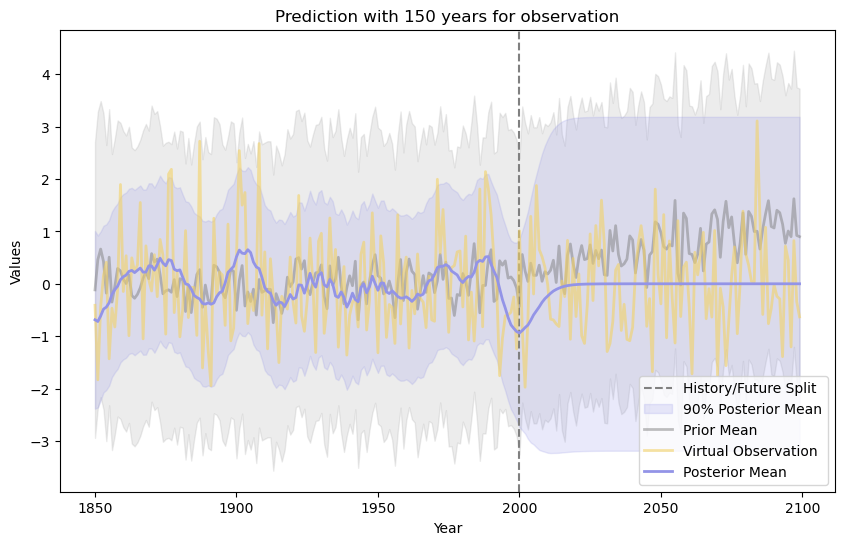

Optimization Progress:   0%|          | 0/1000 [00:00<?, ?it/s]

|   iter    |  target   |    c2     |    c3     |   c_rbf   |    ls1    |    ls2    |   noise   |   per1    |   per2    |  rbf_ls1  |  rbf_ls2  |  rbf_ls3  |
-------------------------------------------------------------------------------------------------------------------------------------------------------------
| 1         | -5.553e+0 | 0.3908    | 2.473     | 0.9869    | 9.14      | 2.675     | 0.2677    | 4.336     | 29.58     | 3.263     | 6.717     | 10.8      |
| 2         | -4.163e+0 | 1.276     | 3.103     | 0.3324    | 2.749     | 5.973     | 0.8256    | 5.014     | 29.75     | 7.836     | 6.781     | 8.85      |
| 3         | -4.191e+0 | 0.2522    | 4.422     | 0.8303    | 1.457     | 6.348     | 0.9683    | 6.945     | 30.28     | 7.209     | 6.609     | 10.99     |
| 4         | -5.379e+0 | 1.395     | 4.516     | 0.514     | 5.93      | 9.608     | 0.284     | 4.937     | 30.25     | 6.461     | 6.717     | 9.167     |
| 5         | -4.249e+0 | 1.584     | 2.913     | 0.

Optimization Progress: 100%|██████████| 1000/1000 [17:25<00:00,  1.05s/it]

| 1000      | -5.43e+03 | 1.07      | 3.194     | 0.8253    | 2.372     | 4.739     | 0.2178    | 5.711     | 28.74     | 4.973     | 8.666     | 12.21     |
Best parameters found:  {'c2': 0.19738839077541323, 'c3': 2.8597179189150643, 'c_rbf': 0.44209497673182396, 'ls1': 7.983000423352839, 'ls2': 3.9016364585830106, 'noise': 0.9360905403983905, 'per1': 6.238346380227954, 'per2': 27.086721118932672, 'rbf_ls1': 1.321478487794433, 'rbf_ls2': 7.797827861792124, 'rbf_ls3': 9.761257125648841}


best kernel is: 0.444**2 * ExpSineSquared(length_scale=7.98, periodicity=6.24) * RBF(length_scale=1.32) + 1.69**2 * ExpSineSquared(length_scale=3.9, periodicity=27.1) * RBF(length_scale=7.8) + 0.665**2 * RBF(length_scale=9.76) + WhiteKernel(noise_level=0.936)


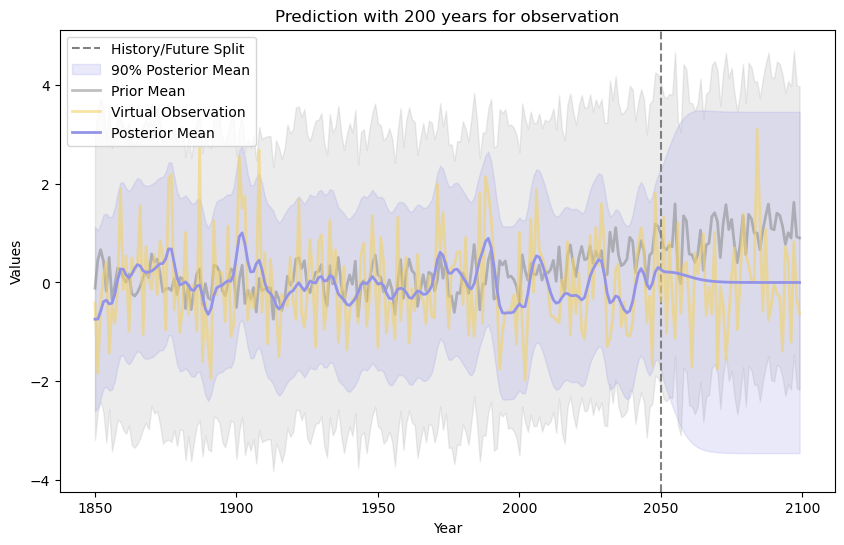

In [44]:
def rbfpe2_rbf(best_params):
    kernel = (
        C(best_params['c2']) * ExpSineSquared(length_scale=best_params['ls1'], periodicity=best_params['per1']) * RBF(length_scale=best_params['rbf_ls1']) +
        C(best_params['c3']) * ExpSineSquared(length_scale=best_params['ls2'], periodicity=best_params['per2']) * RBF(length_scale=best_params['rbf_ls2']) +
        C(best_params['c_rbf']) * RBF(length_scale=best_params['rbf_ls3']) + 
        WhiteKernel(noise_level=best_params['noise'])
    )
    return kernel

pbounds = {
    'c2': (1e-1, 2),
    'c3': (2, 5),
    'c_rbf': (1e-1, 1),     
    'ls1': (1, 10),
    'per1': (3, 7),
    'ls2': (1, 10),
    'per2': (27, 31),
    'rbf_ls1': (1, 10),    
    'rbf_ls2': (1, 10),   
    'rbf_ls3': (5, 15),    
    'noise': (1e-6, 1),
}

Nobs=50
gpr_model(mod_ids, Nobs, rainfall_yearly, pbounds, rbfpe2_rbf, rainfall_yearly_test.iloc[:, 4])
Nobs=100
gpr_model(mod_ids, Nobs, rainfall_yearly, pbounds, rbfpe2_rbf, rainfall_yearly_test.iloc[:, 4])
Nobs=150
gpr_model(mod_ids, Nobs, rainfall_yearly, pbounds, rbfpe2_rbf, rainfall_yearly_test.iloc[:, 4])
Nobs=200
gpr_model(mod_ids, Nobs, rainfall_yearly, pbounds, rbfpe2_rbf, rainfall_yearly_test.iloc[:, 4])


-2972.4730779882593

## Poly(PE)

In [46]:
class CustomPolynomialKernel(Kernel):
    def __init__(self, degree=2, periods=[1, 1, 1], include_bias=False):
        self.degree = degree
        self.periods = periods if isinstance(periods, (list, np.ndarray)) else [periods]
        self.include_bias = include_bias
        self.poly = PolynomialFeatures(degree=self.degree, include_bias=self.include_bias)
    
    def periodic_transform(self, X):
        return np.hstack([np.cos(2 * np.pi * X / p) for p in self.periods] +
                         [np.sin(2 * np.pi * X / p) for p in self.periods])
    
    def __call__(self, X, Y=None, eval_gradient=False):
        X_transformed = self.periodic_transform(X)
        if Y is None:
            Y_transformed = X_transformed
        else:
            Y_transformed = self.periodic_transform(Y)
        
        K = self.poly.fit_transform(X_transformed).dot(self.poly.fit_transform(Y_transformed).T)
        
        if eval_gradient:
            K_gradient = np.zeros((X_transformed.shape[0], Y_transformed.shape[0], 0))
            return K, K_gradient
        else:
            return K
    
    def diag(self, X):
        return np.diag(self.__call__(X))
    
    def is_stationary(self):
        return False

### eye-bowling best

Optimization Progress:   0%|          | 0/1000 [00:00<?, ?it/s]

|   iter    |  target   | constant1 | constant2 | constant3 | constant4 | constant5 | matern... | noise_... |    nu     |  period1  |  period2  |  period3  | rbf_le... | rq_alpha  |   rq_ls   |
-------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------
| 1         | -5.305e+0 | 1.306     | 0.1585    | 0.9855    | 0.9046    | 0.1869    | 27.5      | 0.3341    | 1.789     | 4.006     | 29.54     | 29.32     | 61.88     | 36.78     | 25.82     |
| 2         | -4.396e+0 | 1.389     | 0.553     | 0.8258    | 0.5039    | 0.6879    | 76.2      | 0.6423    | 1.27      | 3.32      | 30.23     | 30.25     | 5.092     | 59.43     | 96.83     |
| 3         | -4.473e+0 | 2.972     | 0.82      | 0.6902    | 0.6236    | 0.5996    | 68.48     | 0.8387    | 1.42      | 5.191     | 30.83     | 28.14     | 48.44     | 81.32     | 60.69     |
| 4         | -4.392e+0 | 2.27

Optimization Progress: 100%|██████████| 1000/1000 [32:43<00:00,  1.96s/it]

| 1000      | -4.16e+03 | 1.0       | 0.5309    | 0.6712    | 1.0       | 0.001     | 71.81     | 1.0       | 0.5       | 7.0       | 27.0      | 27.14     | 64.71     | 26.57     | 91.89     |
Best parameters found:  {'constant1': 1.0, 'constant2': 0.9764337768568973, 'constant3': 0.001, 'constant4': 1.0, 'constant5': 1.0, 'matern_length': 74.1871252144127, 'noise_level': 1.0, 'nu': 0.5, 'period1': 3.0, 'period2': 27.0, 'period3': 27.0, 'rbf_length': 77.69228765462051, 'rq_alpha': 26.47944638876472, 'rq_ls': 93.52496998250714}


best kernel is: 1**2 * CustomPolynomialKernel() + 0.988**2 * RationalQuadratic(alpha=26.5, length_scale=93.5) + 0.0316**2 * Matern(length_scale=74.2, nu=0.5) + 1**2 * RBF(length_scale=77.7) + WhiteKernel(noise_level=1)


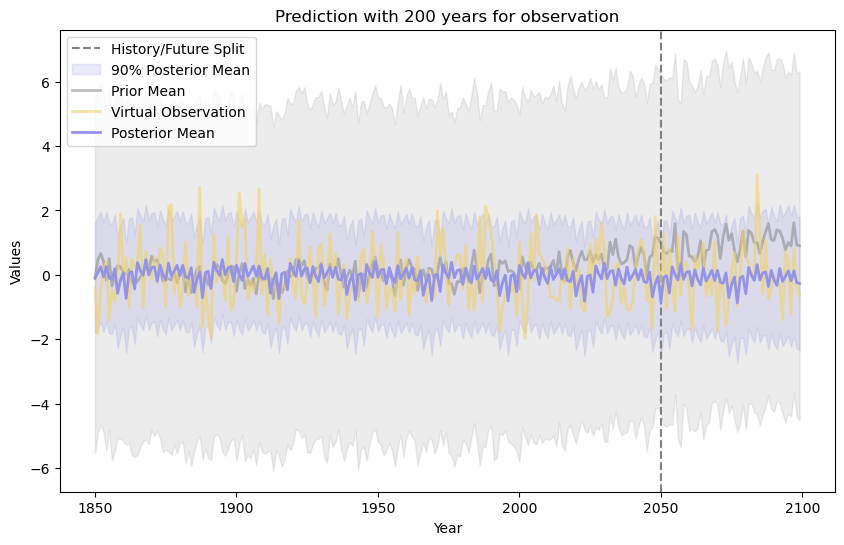

Optimization Progress:   0%|          | 0/1000 [00:00<?, ?it/s]

|   iter    |  target   | constant1 | constant2 | constant3 | constant4 | constant5 | matern... | noise_... |    nu     |  period1  |  period2  |  period3  | rbf_le... | rq_alpha  |   rq_ls   |
-------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------
| 1         | -2.559e+0 | 1.306     | 0.1585    | 0.9855    | 0.9046    | 0.1869    | 27.5      | 0.3341    | 1.789     | 4.006     | 29.54     | 29.32     | 61.88     | 36.78     | 25.82     |
| 2         | -2.216e+0 | 1.389     | 0.553     | 0.8258    | 0.5039    | 0.6879    | 76.2      | 0.6423    | 1.27      | 3.32      | 30.23     | 30.25     | 5.092     | 59.43     | 96.83     |
| 3         | -2.321e+0 | 2.972     | 0.82      | 0.6902    | 0.6236    | 0.5996    | 68.48     | 0.8387    | 1.42      | 5.191     | 30.83     | 28.14     | 48.44     | 81.32     | 60.69     |
| 4         | -2.23e+03 | 2.27

Optimization Progress: 100%|██████████| 1000/1000 [27:31<00:00,  1.65s/it]

| 1000      | -2.169e+0 | 1.0       | 0.001     | 0.001     | 1.0       | 1.0       | 75.78     | 1.0       | 0.5       | 7.0       | 27.0      | 30.0      | 63.13     | 8.809     | 86.72     |
Best parameters found:  {'constant1': 1.0, 'constant2': 1.0, 'constant3': 0.001, 'constant4': 0.001, 'constant5': 1.0, 'matern_length': 82.89216798621383, 'noise_level': 1.0, 'nu': 2.5, 'period1': 3.0, 'period2': 27.521793861647424, 'period3': 27.428581861322034, 'rbf_length': 73.6559172820193, 'rq_alpha': 20.779755617339788, 'rq_ls': 87.22099680723305}


best kernel is: 1**2 * CustomPolynomialKernel() + 1**2 * RationalQuadratic(alpha=20.8, length_scale=87.2) + 0.0316**2 * Matern(length_scale=82.9, nu=2.5) + 0.0316**2 * RBF(length_scale=73.7) + WhiteKernel(noise_level=1)


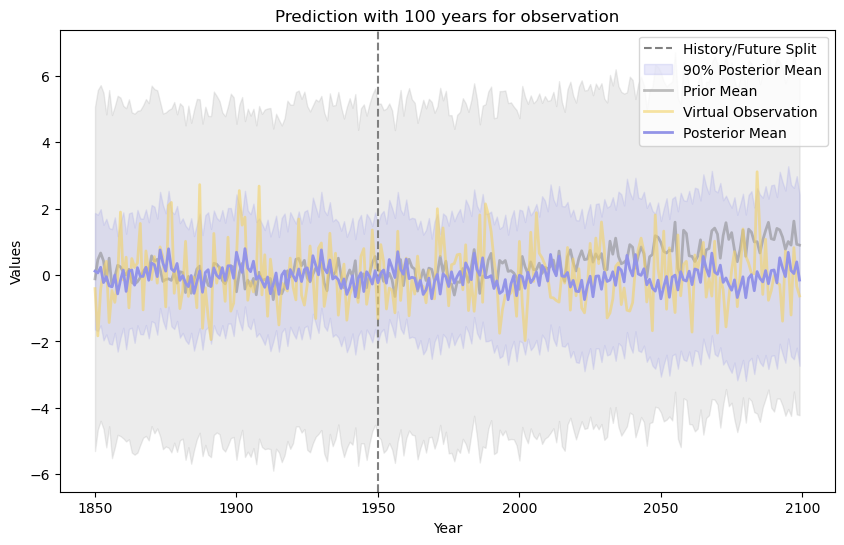

Optimization Progress:   0%|          | 0/1000 [00:00<?, ?it/s]

|   iter    |  target   | constant1 | constant2 | constant3 | constant4 | constant5 | matern... | noise_... |    nu     |  period1  |  period2  |  period3  | rbf_le... | rq_alpha  |   rq_ls   |
-------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------
| 1         | -3.897e+0 | 1.306     | 0.1585    | 0.9855    | 0.9046    | 0.1869    | 27.5      | 0.3341    | 1.789     | 4.006     | 29.54     | 29.32     | 61.88     | 36.78     | 25.82     |
| 2         | -3.281e+0 | 1.389     | 0.553     | 0.8258    | 0.5039    | 0.6879    | 76.2      | 0.6423    | 1.27      | 3.32      | 30.23     | 30.25     | 5.092     | 59.43     | 96.83     |
| 3         | -3.387e+0 | 2.972     | 0.82      | 0.6902    | 0.6236    | 0.5996    | 68.48     | 0.8387    | 1.42      | 5.191     | 30.83     | 28.14     | 48.44     | 81.32     | 60.69     |
| 4         | -3.311e+0 | 2.27

Optimization Progress: 100%|██████████| 1000/1000 [24:18<00:00,  1.46s/it]

| 1000      | -3.229e+0 | 1.149     | 0.8654    | 0.5785    | 0.9399    | 0.9466    | 51.81     | 1.0       | 2.023     | 5.255     | 29.53     | 27.66     | 69.67     | 53.69     | 27.01     |
Best parameters found:  {'constant1': 1.0, 'constant2': 0.001, 'constant3': 0.001, 'constant4': 0.001, 'constant5': 0.001, 'matern_length': 27.89083307984406, 'noise_level': 1.0, 'nu': 0.5, 'period1': 6.467383409547225, 'period2': 27.0, 'period3': 27.48823981839906, 'rbf_length': 55.376063369426156, 'rq_alpha': 27.18841247276327, 'rq_ls': 27.861355853233313}


best kernel is: 1**2 * CustomPolynomialKernel() + 0.0316**2 * RationalQuadratic(alpha=27.2, length_scale=27.9) + 0.0316**2 * Matern(length_scale=27.9, nu=0.5) + 0.0316**2 * RBF(length_scale=55.4) + WhiteKernel(noise_level=1)


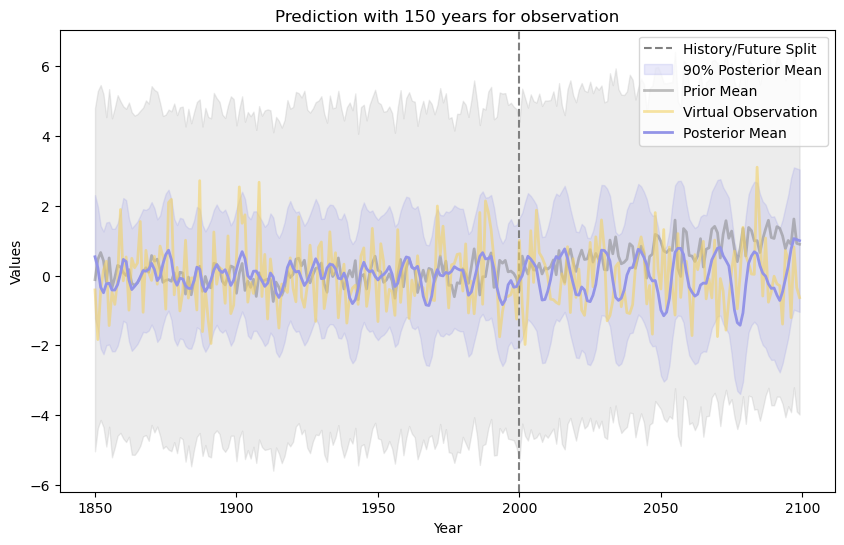

Optimization Progress:   0%|          | 0/1000 [00:00<?, ?it/s]

|   iter    |  target   | constant1 | constant2 | constant3 | constant4 | constant5 | matern... | noise_... |    nu     |  period1  |  period2  |  period3  | rbf_le... | rq_alpha  |   rq_ls   |
-------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------
| 1         | -5.305e+0 | 1.306     | 0.1585    | 0.9855    | 0.9046    | 0.1869    | 27.5      | 0.3341    | 1.789     | 4.006     | 29.54     | 29.32     | 61.88     | 36.78     | 25.82     |
| 2         | -4.396e+0 | 1.389     | 0.553     | 0.8258    | 0.5039    | 0.6879    | 76.2      | 0.6423    | 1.27      | 3.32      | 30.23     | 30.25     | 5.092     | 59.43     | 96.83     |
| 3         | -4.473e+0 | 2.972     | 0.82      | 0.6902    | 0.6236    | 0.5996    | 68.48     | 0.8387    | 1.42      | 5.191     | 30.83     | 28.14     | 48.44     | 81.32     | 60.69     |
| 4         | -4.392e+0 | 2.27

Optimization Progress: 100%|██████████| 1000/1000 [33:00<00:00,  1.98s/it]


| 1000      | -4.16e+03 | 1.0       | 0.5309    | 0.6712    | 1.0       | 0.001     | 71.81     | 1.0       | 0.5       | 7.0       | 27.0      | 27.14     | 64.71     | 26.57     | 91.89     |
Best parameters found:  {'constant1': 1.0, 'constant2': 0.9764337768568973, 'constant3': 0.001, 'constant4': 1.0, 'constant5': 1.0, 'matern_length': 74.1871252144127, 'noise_level': 1.0, 'nu': 0.5, 'period1': 3.0, 'period2': 27.0, 'period3': 27.0, 'rbf_length': 77.69228765462051, 'rq_alpha': 26.47944638876472, 'rq_ls': 93.52496998250714}
best kernel is: 1**2 * CustomPolynomialKernel() + 0.988**2 * RationalQuadratic(alpha=26.5, length_scale=93.5) + 0.0316**2 * Matern(length_scale=74.2, nu=0.5) + 1**2 * RBF(length_scale=77.7) + WhiteKernel(noise_level=1)


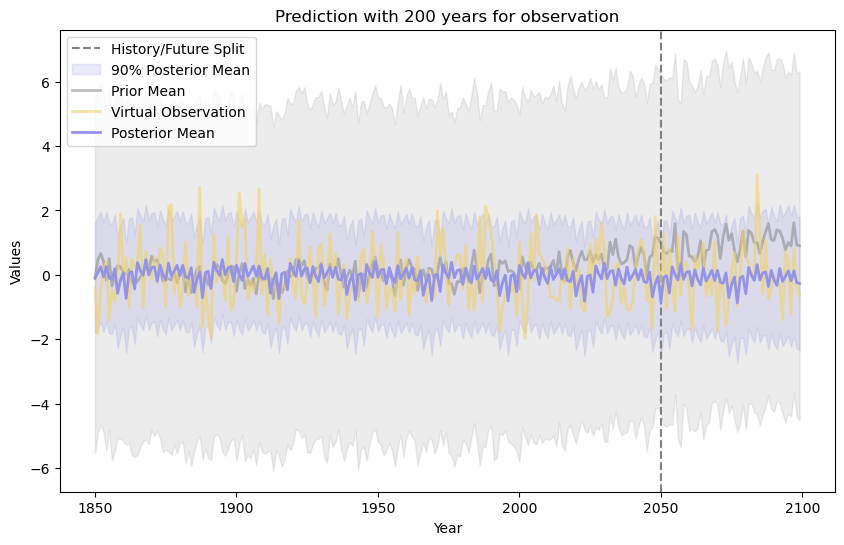

In [47]:
def polype3_rq_matern_rbf(best_params):
    custom_poly_kernel = C(best_params['constant1']) * CustomPolynomialKernel(degree=2, periods=[best_params['period1'], best_params['period2'], best_params['period3']])
    original_kernel = (
        C(best_params['constant2']) * RQ(length_scale=best_params['rq_ls'], alpha=best_params['rq_alpha']) +
        C(best_params['constant3']) * Matern(length_scale=best_params['matern_length'], nu=best_params['nu']) +
        C(best_params['constant4']) * RBF(length_scale=best_params['rbf_length']) +
        WhiteKernel(noise_level=best_params['noise_level'])
    )
    return custom_poly_kernel + original_kernel

pbounds = {
    'period1': (3,7),
    'period2': (27,31),
    'period3': (27,31),
    'rq_alpha': (1e-2, 1e2),
    'matern_length': (1e0, 1e2),
    'noise_level': (1e-6, 1),
    'constant1': (1, 3),
    'constant2': (1e-3, 1),
    'constant3': (1e-3, 1),
    'constant4': (1e-3, 1),
    'constant5': (1e-3, 1),
    'rbf_length': (1e-2, 1e2),
    'nu': (0.5, 2.5),
    'rq_ls': (1e-2, 1e2)
}

Nobs=200
gpr_model(mod_ids, Nobs, rainfall_yearly, pbounds, polype3_rq_matern_rbf, rainfall_yearly_test.iloc[:, 4])
Nobs=100
gpr_model(mod_ids, Nobs, rainfall_yearly, pbounds, polype3_rq_matern_rbf, rainfall_yearly_test.iloc[:, 4])
Nobs=150
gpr_model(mod_ids, Nobs, rainfall_yearly, pbounds, polype3_rq_matern_rbf, rainfall_yearly_test.iloc[:, 4])
Nobs=200
gpr_model(mod_ids, Nobs, rainfall_yearly, pbounds, polype3_rq_matern_rbf, rainfall_yearly_test.iloc[:, 4])

Optimization Progress:   0%|          | 0/1000 [00:00<?, ?it/s]

|   iter    |  target   | constant1 | constant2 | constant3 | constant4 | constant5 | constant6 | matern... | noise_... |    nu     |  period1  |  period2  |  period3  | rbf_le... | rq_alpha  |   rq_ls   |
-------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------
| 1         | -1.117e+0 | 1.306     | 1.315     | 2.971     | 0.4523    | 0.09385   | 0.1346    | 4.006     | 0.6446    | 1.003     | 5.541     | 29.32     | 29.48     | 3.684     | 0.2656    | 1.952     |
| 2         | -2.734e+0 | 2.105     | 2.651     | 2.007     | 0.3441    | 0.38      | 0.3215    | 4.465     | 0.0801    | 2.115     | 6.246     | 27.2      | 29.38     | 9.683     | 0.9864    | 8.2       |
| 3         | -1.129e+0 | 2.38      | 2.246     | 2.198     | 0.3411    | 0.4195    | 0.2305    | 5.93      | 0.9565    | 1.068     | 4.937     | 30.25     | 29.43     | 6.355 

Optimization Progress: 100%|██████████| 1000/1000 [32:29<00:00,  1.95s/it]

| 1000      | -1.132e+0 | 2.454     | 3.0       | 2.199     | 0.4016    | 0.5       | 0.3362    | 5.471     | 1.0       | 0.5       | 4.598     | 28.52     | 27.71     | 5.19      | 0.01      | 3.507     |
Best parameters found:  {'constant1': 1.3201924740108575, 'constant2': 1.0, 'constant3': 1.0, 'constant4': 0.08803519498174406, 'constant5': 0.38691744526568494, 'constant6': 0.2668711821391087, 'matern_length': 9.604157712090892, 'noise_level': 1.0, 'nu': 0.5, 'period1': 3.0, 'period2': 29.739809581255695, 'period3': 28.868773123225637, 'rbf_length': 7.100492146477567, 'rq_alpha': 0.8605718081757824, 'rq_ls': 1.0839613797992416}


best kernel is: 1.15**2 * CustomPolynomialKernel() + 1**2 * CustomPolynomialKernel() + 1**2 * CustomPolynomialKernel() + 0.297**2 * RationalQuadratic(alpha=0.861, length_scale=1.08) + 0.622**2 * Matern(length_scale=9.6, nu=0.5) + 0.517**2 * RBF(length_scale=7.1) + WhiteKernel(noise_level=1)


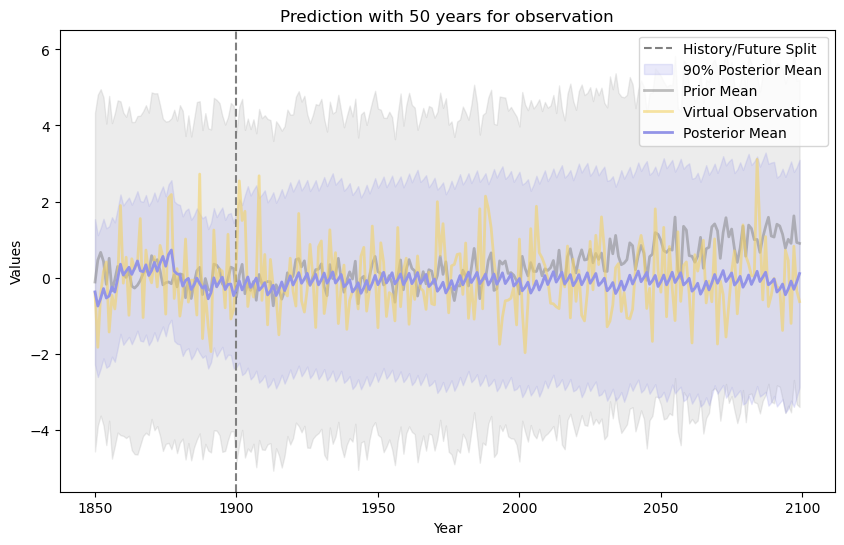

Optimization Progress:   0%|          | 0/1000 [00:00<?, ?it/s]

|   iter    |  target   | constant1 | constant2 | constant3 | constant4 | constant5 | constant6 | matern... | noise_... |    nu     |  period1  |  period2  |  period3  | rbf_le... | rq_alpha  |   rq_ls   |
-------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------
| 1         | -2.11e+03 | 1.306     | 1.315     | 2.971     | 0.4523    | 0.09385   | 0.1346    | 4.006     | 0.6446    | 1.003     | 5.541     | 29.32     | 29.48     | 3.684     | 0.2656    | 1.952     |
| 2         | -5.545e+0 | 2.105     | 2.651     | 2.007     | 0.3441    | 0.38      | 0.3215    | 4.465     | 0.0801    | 2.115     | 6.246     | 27.2      | 29.38     | 9.683     | 0.9864    | 8.2       |
| 3         | -2.12e+03 | 2.38      | 2.246     | 2.198     | 0.3411    | 0.4195    | 0.2305    | 5.93      | 0.9565    | 1.068     | 4.937     | 30.25     | 29.43     | 6.355 

Optimization Progress: 100%|██████████| 1000/1000 [34:59<00:00,  2.10s/it]

| 1000      | -2.043e+0 | 1.0       | 2.194     | 2.247     | 0.5       | 0.001     | 0.001     | 7.642     | 1.0       | 1.748     | 3.0       | 28.49     | 30.0      | 2.425     | 0.01      | 4.887     |
Best parameters found:  {'constant1': 1.0, 'constant2': 1.0, 'constant3': 1.8546794766137549, 'constant4': 0.001, 'constant5': 0.001, 'constant6': 0.001, 'matern_length': 2.2510871892118076, 'noise_level': 1.0, 'nu': 0.5, 'period1': 3.0, 'period2': 29.791224554890988, 'period3': 29.436115700246912, 'rbf_length': 1.5966114710897052, 'rq_alpha': 1.0, 'rq_ls': 1.61669533878317}


best kernel is: 1**2 * CustomPolynomialKernel() + 1**2 * CustomPolynomialKernel() + 1.36**2 * CustomPolynomialKernel() + 0.0316**2 * RationalQuadratic(alpha=1, length_scale=1.62) + 0.0316**2 * Matern(length_scale=2.25, nu=0.5) + 0.0316**2 * RBF(length_scale=1.6) + WhiteKernel(noise_level=1)


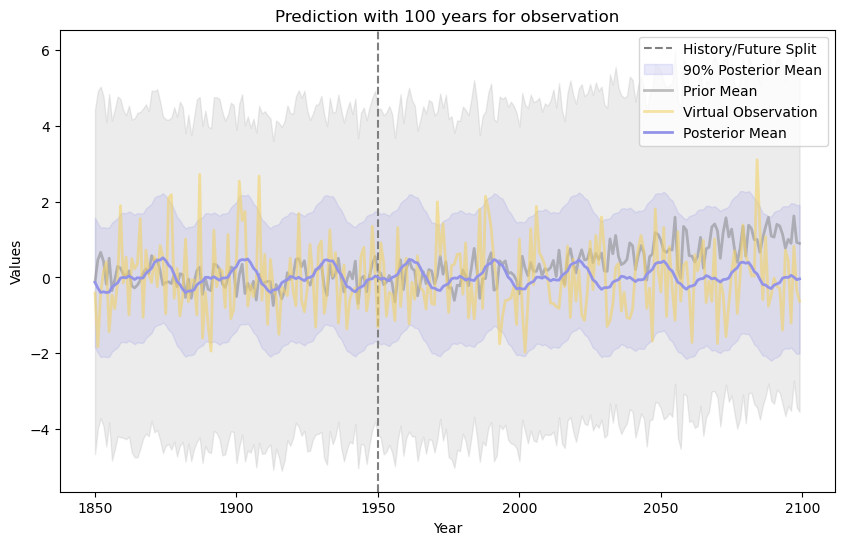

Optimization Progress:   0%|          | 0/1000 [00:00<?, ?it/s]

|   iter    |  target   | constant1 | constant2 | constant3 | constant4 | constant5 | constant6 | matern... | noise_... |    nu     |  period1  |  period2  |  period3  | rbf_le... | rq_alpha  |   rq_ls   |
-------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------
| 1         | -3.133e+0 | 1.306     | 1.315     | 2.971     | 0.4523    | 0.09385   | 0.1346    | 4.006     | 0.6446    | 1.003     | 5.541     | 29.32     | 29.48     | 3.684     | 0.2656    | 1.952     |
| 2         | -8.76e+03 | 2.105     | 2.651     | 2.007     | 0.3441    | 0.38      | 0.3215    | 4.465     | 0.0801    | 2.115     | 6.246     | 27.2      | 29.38     | 9.683     | 0.9864    | 8.2       |
| 3         | -3.154e+0 | 2.38      | 2.246     | 2.198     | 0.3411    | 0.4195    | 0.2305    | 5.93      | 0.9565    | 1.068     | 4.937     | 30.25     | 29.43     | 6.355 

Optimization Progress: 100%|██████████| 1000/1000 [37:28<00:00,  2.25s/it]

| 1000      | -3.063e+0 | 1.0       | 1.0       | 1.83      | 0.001     | 0.001     | 0.001     | 3.269     | 1.0       | 0.5       | 5.346     | 27.27     | 29.67     | 3.966     | 1.0       | 7.833     |
Best parameters found:  {'constant1': 1.0829546287878236, 'constant2': 1.676335713438912, 'constant3': 1.2373747782494753, 'constant4': 0.035793286687629364, 'constant5': 0.07400241960476184, 'constant6': 0.053752958198419916, 'matern_length': 9.871057145841766, 'noise_level': 0.863512514453813, 'nu': 1.8766798433962124, 'period1': 3.933998946095181, 'period2': 28.36527671141028, 'period3': 27.52895968071957, 'rbf_length': 0.5144033266496402, 'rq_alpha': 0.034874063330255146, 'rq_ls': 0.9931938202535644}


best kernel is: 1.04**2 * CustomPolynomialKernel() + 1.29**2 * CustomPolynomialKernel() + 1.11**2 * CustomPolynomialKernel() + 0.189**2 * RationalQuadratic(alpha=0.0349, length_scale=0.993) + 0.272**2 * Matern(length_scale=9.87, nu=1.88) + 0.232**2 * RBF(length_scale=0.514) + WhiteKernel(noise_level=0.864)


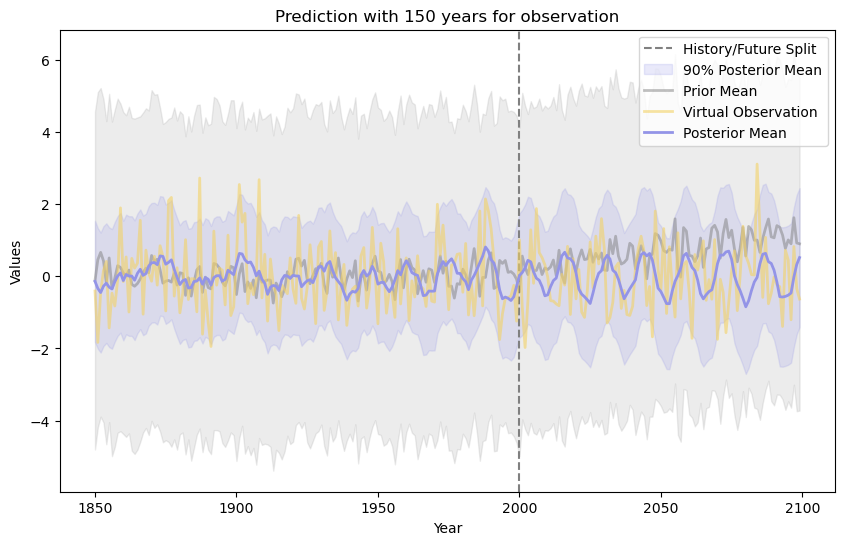

Optimization Progress:   0%|          | 0/1000 [00:00<?, ?it/s]

|   iter    |  target   | constant1 | constant2 | constant3 | constant4 | constant5 | constant6 | matern... | noise_... |    nu     |  period1  |  period2  |  period3  | rbf_le... | rq_alpha  |   rq_ls   |
-------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------
| 1         | -4.213e+0 | 1.306     | 1.315     | 2.971     | 0.4523    | 0.09385   | 0.1346    | 4.006     | 0.6446    | 1.003     | 5.541     | 29.32     | 29.48     | 3.684     | 0.2656    | 1.952     |
| 2         | -1.222e+0 | 2.105     | 2.651     | 2.007     | 0.3441    | 0.38      | 0.3215    | 4.465     | 0.0801    | 2.115     | 6.246     | 27.2      | 29.38     | 9.683     | 0.9864    | 8.2       |
| 3         | -4.209e+0 | 2.38      | 2.246     | 2.198     | 0.3411    | 0.4195    | 0.2305    | 5.93      | 0.9565    | 1.068     | 4.937     | 30.25     | 29.43     | 6.355 

Optimization Progress: 100%|██████████| 1000/1000 [36:47<00:00,  2.21s/it]

| 1000      | -4.229e+0 | 1.992     | 3.0       | 2.093     | 0.001     | 0.5       | 0.5       | 9.361     | 1.0       | 1.92      | 5.6       | 30.38     | 31.0      | 0.4883    | 0.01      | 0.9297    |
Best parameters found:  {'constant1': 1.8358463970589778, 'constant2': 2.4243566151239433, 'constant3': 1.7035109357008529, 'constant4': 0.5, 'constant5': 0.001, 'constant6': 0.001, 'matern_length': 8.574296343574796, 'noise_level': 1.0, 'nu': 0.9171667828493605, 'period1': 3.0, 'period2': 30.98176409521048, 'period3': 30.765884840213655, 'rbf_length': 4.951892031249135, 'rq_alpha': 0.01, 'rq_ls': 0.7184360010710609}


best kernel is: 1.35**2 * CustomPolynomialKernel() + 1.56**2 * CustomPolynomialKernel() + 1.31**2 * CustomPolynomialKernel() + 0.707**2 * RationalQuadratic(alpha=0.01, length_scale=0.718) + 0.0316**2 * Matern(length_scale=8.57, nu=0.917) + 0.0316**2 * RBF(length_scale=4.95) + WhiteKernel(noise_level=1)


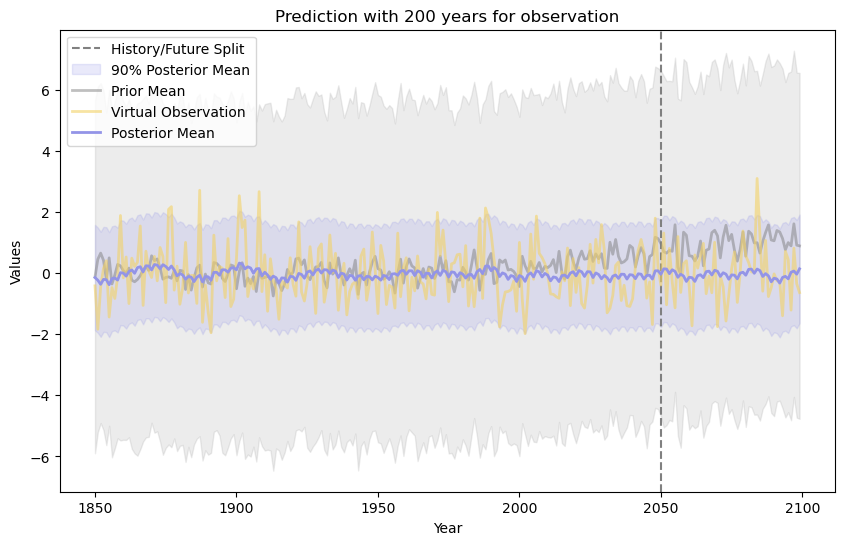

In [48]:
def polype3_rq_matern_rbf_true(best_params):
    custom_poly_kernel1 = C(best_params['constant1']) * CustomPolynomialKernel(degree=2, periods=best_params['period1'])
    custom_poly_kernel2 = C(best_params['constant2']) * CustomPolynomialKernel(degree=2, periods=best_params['period2'])
    custom_poly_kernel3 = C(best_params['constant3']) * CustomPolynomialKernel(degree=2, periods=best_params['period3'])
    
    original_kernel = (
        C(best_params['constant4']) * RQ(length_scale=best_params['rq_ls'], alpha=best_params['rq_alpha']) +
        C(best_params['constant5']) * Matern(length_scale=best_params['matern_length'], nu=best_params['nu']) +
        C(best_params['constant6']) * RBF(length_scale=best_params['rbf_length']) +
        WhiteKernel(noise_level=best_params['noise_level'])
    )
    
    return custom_poly_kernel1 + custom_poly_kernel2 + custom_poly_kernel3 + original_kernel

pbounds = {
    'period1':(3,7),
    'period2': (27,31),
    'period3': (27,31),
    'rq_alpha': (1e-2, 1),
    'matern_length': (1e0, 10),
    'noise_level': (1e-6, 1),
    'constant1': (1, 3),
    'constant2': (1, 3),
    'constant3': (1, 3),
    'constant4': (1e-3, 0.5),
    'constant5': (1e-3, 0.5),
    'constant6': (1e-3, 0.5),
    'rbf_length': (1e-2, 10),
    'nu': (0.5, 2.5),
    'rq_ls': (1e-2, 10)
}

Nobs=50
gpr_model(mod_ids, Nobs, rainfall_yearly, pbounds, polype3_rq_matern_rbf_true, rainfall_yearly_test.iloc[:, 4])
Nobs=100
gpr_model(mod_ids, Nobs, rainfall_yearly, pbounds, polype3_rq_matern_rbf_true, rainfall_yearly_test.iloc[:, 4])
Nobs=150
gpr_model(mod_ids, Nobs, rainfall_yearly, pbounds, polype3_rq_matern_rbf_true, rainfall_yearly_test.iloc[:, 4])
Nobs=200
gpr_model(mod_ids, Nobs, rainfall_yearly, pbounds, polype3_rq_matern_rbf_true, rainfall_yearly_test.iloc[:, 4])


## original

Optimization Progress:   0%|          | 0/1000 [00:00<?, ?it/s]

|   iter    |  target   | consta... | noise_... | rbf_le... |
-------------------------------------------------------------
| 1         | -1.956e+0 | 0.1539    | 0.1577    | 9.855     |
| 2         | -1.493e+0 | 0.9046    | 0.1861    | 2.684     |
| 3         | -960.2    | 0.3347    | 0.6446    | 2.522     |
| 4         | -1.004e+0 | 0.6356    | 0.5798    | 6.192     |
| 5         | -1.2e+03  | 0.3684    | 0.2582    | 1.952     |
| 6         | -960.8    | 0.553     | 0.8256    | 5.039     |
| 7         | -970.1    | 0.6879    | 0.7595    | 6.427     |
| 8         | -3.423e+0 | 0.3856    | 0.0801    | 8.077     |
| 9         | -5.039e+0 | 0.8117    | 0.05083   | 5.947     |
| 10        | -967.0    | 0.9683    | 0.9862    | 8.2       |
| 11        | -993.6    | 0.6902    | 0.6232    | 5.996     |
| 12        | -966.6    | 0.6819    | 0.8387    | 4.606     |
| 13        | -957.7    | 0.5482    | 0.9565    | 2.847     |
| 14        | -957.6    | 0.4849    | 0.8131    | 6.072     |
| 15    

Optimization Progress: 100%|██████████| 1000/1000 [22:24<00:00,  1.34s/it]

| 1000      | -1.151e+0 | 0.5817    | 0.2896    | 2.055     |
Best parameters found:  {'constant_rbf': 1.0, 'noise_level': 1e-06, 'rbf_length': 0.45500965539046295}


best kernel is: 1**2 * RBF(length_scale=0.455) + WhiteKernel(noise_level=1e-06)


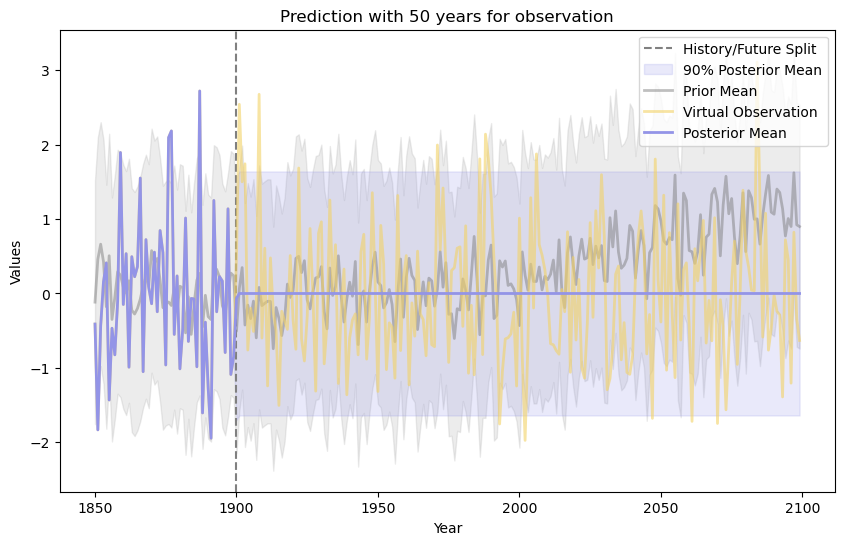

Optimization Progress:   0%|          | 0/1000 [00:00<?, ?it/s]

|   iter    |  target   | consta... | noise_... | rbf_le... |
-------------------------------------------------------------
| 1         | -3.802e+0 | 0.1539    | 0.1577    | 9.855     |
| 2         | -2.966e+0 | 0.9046    | 0.1861    | 2.684     |
| 3         | -1.902e+0 | 0.3347    | 0.6446    | 2.522     |
| 4         | -1.977e+0 | 0.6356    | 0.5798    | 6.192     |
| 5         | -2.388e+0 | 0.3684    | 0.2582    | 1.952     |
| 6         | -1.9e+03  | 0.553     | 0.8256    | 5.039     |
| 7         | -1.916e+0 | 0.6879    | 0.7595    | 6.427     |
| 8         | -6.683e+0 | 0.3856    | 0.0801    | 8.077     |
| 9         | -9.814e+0 | 0.8117    | 0.05083   | 5.947     |
| 10        | -1.912e+0 | 0.9683    | 0.9862    | 8.2       |
| 11        | -1.959e+0 | 0.6902    | 0.6232    | 5.996     |
| 12        | -1.912e+0 | 0.6819    | 0.8387    | 4.606     |
| 13        | -1.901e+0 | 0.5482    | 0.9565    | 2.847     |
| 14        | -1.893e+0 | 0.4849    | 0.8131    | 6.072     |
| 15    

Optimization Progress: 100%|██████████| 1000/1000 [22:05<00:00,  1.33s/it]

| 1000      | -2.225e+0 | 1.0       | 0.3167    | 1.888     |
Best parameters found:  {'constant_rbf': 1.0, 'noise_level': 1e-06, 'rbf_length': 0.43139950178109965}


best kernel is: 1**2 * RBF(length_scale=0.431) + WhiteKernel(noise_level=1e-06)


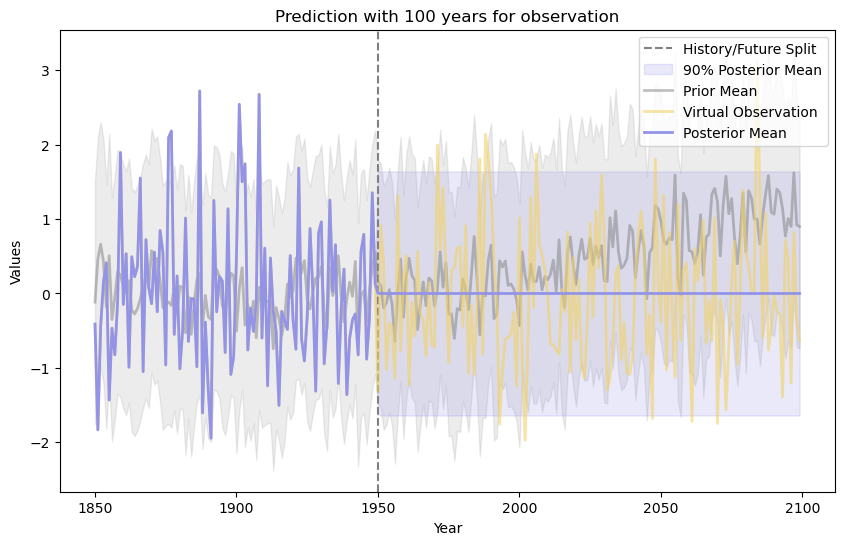

Optimization Progress:   0%|          | 0/1000 [00:00<?, ?it/s]

|   iter    |  target   | consta... | noise_... | rbf_le... |
-------------------------------------------------------------
| 1         | -5.961e+0 | 0.1539    | 0.1577    | 9.855     |
| 2         | -4.587e+0 | 0.9046    | 0.1861    | 2.684     |
| 3         | -2.899e+0 | 0.3347    | 0.6446    | 2.522     |
| 4         | -3.037e+0 | 0.6356    | 0.5798    | 6.192     |
| 5         | -3.677e+0 | 0.3684    | 0.2582    | 1.952     |
| 6         | -2.896e+0 | 0.553     | 0.8256    | 5.039     |
| 7         | -2.927e+0 | 0.6879    | 0.7595    | 6.427     |
| 8         | -1.06e+04 | 0.3856    | 0.0801    | 8.077     |
| 9         | -1.553e+0 | 0.8117    | 0.05083   | 5.947     |
| 10        | -2.909e+0 | 0.9683    | 0.9862    | 8.2       |
| 11        | -3.003e+0 | 0.6902    | 0.6232    | 5.996     |
| 12        | -2.912e+0 | 0.6819    | 0.8387    | 4.606     |
| 13        | -2.884e+0 | 0.5482    | 0.9565    | 2.847     |
| 14        | -2.888e+0 | 0.4849    | 0.8131    | 6.072     |
| 15    

Optimization Progress: 100%|██████████| 1000/1000 [23:29<00:00,  1.41s/it]

| 1000      | -4.35e+03 | 0.2779    | 1e-06     | 0.5585    |
Best parameters found:  {'constant_rbf': 0.03051825086893311, 'noise_level': 0.9984340245038591, 'rbf_length': 9.794858794052146}


best kernel is: 0.175**2 * RBF(length_scale=9.79) + WhiteKernel(noise_level=0.998)


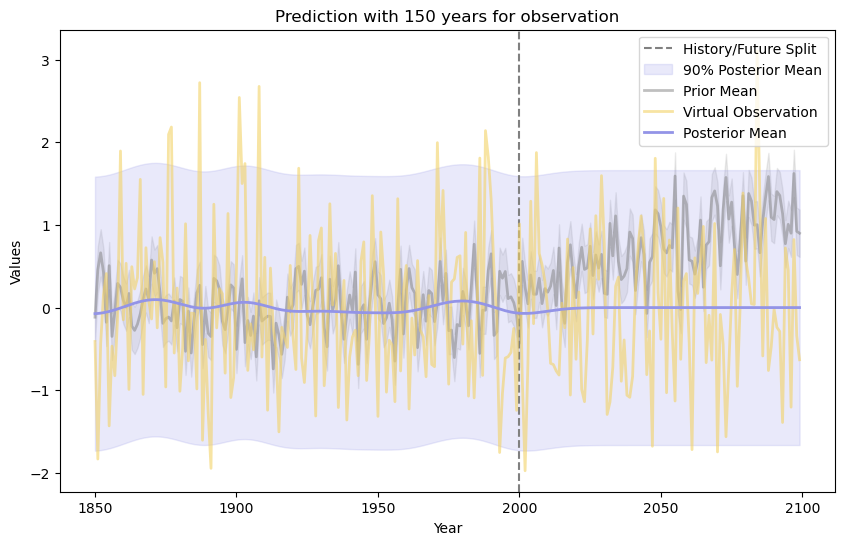

Optimization Progress:   0%|          | 0/1000 [00:00<?, ?it/s]

|   iter    |  target   | consta... | noise_... | rbf_le... |
-------------------------------------------------------------
| 1         | -8.381e+0 | 0.1539    | 0.1577    | 9.855     |
| 2         | -6.394e+0 | 0.9046    | 0.1861    | 2.684     |
| 3         | -4.026e+0 | 0.3347    | 0.6446    | 2.522     |
| 4         | -4.171e+0 | 0.6356    | 0.5798    | 6.192     |
| 5         | -5.17e+03 | 0.3684    | 0.2582    | 1.952     |
| 6         | -3.96e+03 | 0.553     | 0.8256    | 5.039     |
| 7         | -3.999e+0 | 0.6879    | 0.7595    | 6.427     |
| 8         | -1.489e+0 | 0.3856    | 0.0801    | 8.077     |
| 9         | -2.178e+0 | 0.8117    | 0.05083   | 5.947     |
| 10        | -3.948e+0 | 0.9683    | 0.9862    | 8.2       |
| 11        | -4.117e+0 | 0.6902    | 0.6232    | 5.996     |
| 12        | -3.975e+0 | 0.6819    | 0.8387    | 4.606     |
| 13        | -3.946e+0 | 0.5482    | 0.9565    | 2.847     |
| 14        | -3.95e+03 | 0.4849    | 0.8131    | 6.072     |
| 15    

Optimization Progress: 100%|██████████| 1000/1000 [25:00<00:00,  1.50s/it]

| 1000      | -5.537e+0 | 0.001     | 0.3546    | 9.224     |
Best parameters found:  {'constant_rbf': 0.13138866749190153, 'noise_level': 0.9667161841752591, 'rbf_length': 9.556944316721598}


best kernel is: 0.362**2 * RBF(length_scale=9.56) + WhiteKernel(noise_level=0.967)


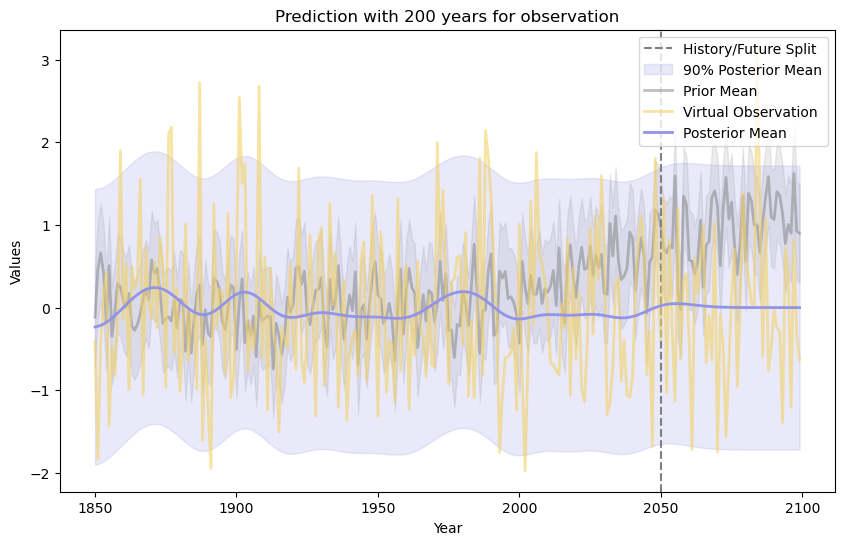

In [49]:
def rbf(best_params):
    combined_kernel = (
        C(best_params['constant_rbf']) * RBF(length_scale=best_params['rbf_length']) +
        WhiteKernel(noise_level=best_params['noise_level'])
    )
    return combined_kernel

pbounds = {
    'rbf_length': (1e-2, 10), 
    'noise_level': (1e-6, 1),  
    'constant_rbf': (1e-3, 1),  
}

Nobs=50
gpr_model(mod_ids, Nobs, rainfall_yearly, pbounds, rbf, rainfall_yearly_test.iloc[:, 4])
Nobs=100
gpr_model(mod_ids, Nobs, rainfall_yearly, pbounds, rbf, rainfall_yearly_test.iloc[:, 4])
Nobs=150
gpr_model(mod_ids, Nobs, rainfall_yearly, pbounds, rbf, rainfall_yearly_test.iloc[:, 4])
Nobs=200
gpr_model(mod_ids, Nobs, rainfall_yearly, pbounds, rbf, rainfall_yearly_test.iloc[:, 4])